## Setting up environment and importing libraries

In this segment, we install the libraries required and set up the environment to train the models. Please choose a GPU runtime .

* L'analyse graphique montre visuellement qu'il est réalisable de séparer automatiquement les images selon leurs vraies classes
* Ceci suffit à démontrer la faisabilité de réaliser ultérieurement une classification supervisée pour déterminer automatiquement les classes des images
* Cette étape 1 est très rapide à mettre en oeuvre. Une conclusion négative sur la faisabilité aurait éviter de réaliser des traitements beaucoup plus lourd de classification supervisée
* Cette démarche en 2 étapes (1. Faisabilité, 2. Classification supervisée si étape 1 OK) s'inscrit dans une démarche agile de tout projet Data

In [3]:
# install required libraries
# !pip install transformers timm
# %pip install missingno

In [4]:
import json
import os
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from sklearn.metrics import accuracy_score, classification_report
from transformers import AutoModel, AutoTokenizer, get_scheduler
from torch.utils.data import Dataset, DataLoader, RandomSampler, SequentialSampler
from torch.optim import AdamW
from tqdm.notebook import tqdm, trange
from time import perf_counter
from PIL import Image
import pandas as pd
import nltk
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from nltk.corpus import stopwords
from collections import Counter
from collections import defaultdict
from nltk.stem import WordNetLemmatizer
from nltk.stem.snowball import SnowballStemmer
from sklearn.manifold import TSNE
from sklearn import decomposition
from sklearn import preprocessing 
from sklearn.feature_extraction.text import TfidfVectorizer

import warnings
warnings.filterwarnings('ignore')
import missingno as msno


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Common configurations to be used throughout the notebook

In [5]:
# use GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [6]:
# set random seeds for repeatability
import numpy as np
import random

def set_seed(seed_val):
    random.seed(seed_val)
    np.random.seed(seed_val)
    torch.manual_seed(seed_val)
    torch.cuda.manual_seed_all(seed_val)

In [7]:
seed_val = 0
set_seed(seed_val)

Defines the paths to read data from, as well as training parameters which we are going to use for all three models.



In [8]:
HOME_FOLDER = "I:\\openclassroom\\projet-6-final\\monprojet\\Flipkart\\"
IMAGE_FOLDER = HOME_FOLDER + 'images/'
RESULTS_FOLDER = HOME_FOLDER + 'results/'
os.makedirs(RESULTS_FOLDER, exist_ok=True)

In [9]:
# Utilisez le chemin absolu complet pour accéder au fichier
file_path = './Flipkart/flipkart_com-ecommerce_sample_1050.csv'

df = pd.read_csv(file_path)
df=df[['uniq_id','product_name','description','product_category_tree']]



In [10]:
df['img_path']=df['uniq_id']+'.jpg'

In [11]:
df['img_path']

0       55b85ea15a1536d46b7190ad6fff8ce7.jpg
1       7b72c92c2f6c40268628ec5f14c6d590.jpg
2       64d5d4a258243731dc7bbb1eef49ad74.jpg
3       d4684dcdc759dd9cdf41504698d737d8.jpg
4       6325b6870c54cd47be6ebfbffa620ec7.jpg
                        ...                 
1045    958f54f4c46b53c8a0a9b8167d9140bc.jpg
1046    fd6cbcc22efb6b761bd564c28928483c.jpg
1047    5912e037d12774bb73a2048f35a00009.jpg
1048    c3edc504d1b4f0ba6224fa53a43a7ad6.jpg
1049    f2f027ad6a6df617c9f125173da71e44.jpg
Name: img_path, Length: 1050, dtype: object

Exceute the cells below to see a random label, text, image triplet from the train dataset

In [12]:
import matplotlib.pyplot as plt

def show_sample(row_num):
    sample_row = df.iloc[row_num]
    print('Index:', row_num)
    print('product_name:', sample_row['product_name'])
    print('description:', sample_row['description'])
    image_path = IMAGE_FOLDER + sample_row['img_path']
    im = Image.open(image_path)
    plt.imshow(im)

In [13]:
df.describe()

,uniq_id,product_name,description,product_category_tree,img_path
count,1050,1050,1050,1050,1050
unique,1050,1050,1050,642,1050
top,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,"[""Home Furnishing >> Bed Linen >> Blankets, Qu...",55b85ea15a1536d46b7190ad6fff8ce7.jpg
freq,1,1,1,56,1


Index: 788
product_name: Perucci PC-414W Decker Analog Watch  - For Men
description: Perucci PC-414W Decker Analog Watch  - For Men - Buy Perucci PC-414W Decker Analog Watch  - For Men  PC-414W Online at Rs.390 in India Only at Flipkart.com. Beautifull Watches, Comfortable Watches, Fancy Watche, Stylish Watches - Great Discounts, Only Genuine Products, 30 Day Replacement Guarantee, Free Shipping. Cash On Delivery!


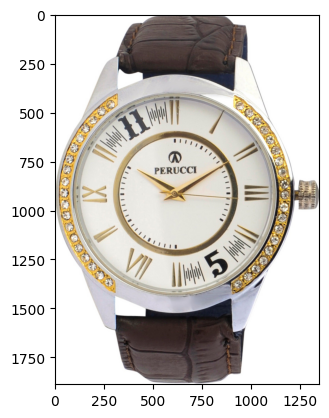

In [14]:
from random import randint

show_sample(randint(0, len(df)))

## Traitement du texte  et images - Description
On va ici procéder à un traitement de texte pour extraire des features pour chaques produit. L'idée est de traiter uniquement la description des produits et charger l 'image.
### A - Tokenisation <a name=A ></a>
Découpage du texte en mots séparés, en prenant soin de retirer la ponctuation et les caractères tels que les apostrophes et les chiffres. On en profites aussi pour mettre le texte en minsucule pour uniformiser le corpus.

In [15]:
df['description']

0       Key Features of Elegance Polyester Multicolor ...
1       Specifications of Sathiyas Cotton Bath Towel (...
2       Key Features of Eurospa Cotton Terry Face Towe...
3       Key Features of SANTOSH ROYAL FASHION Cotton P...
4       Key Features of Jaipur Print Cotton Floral Kin...
                              ...                        
1045    Oren Empower Extra Large Self Adhesive Sticker...
1046    Wallmantra Large Vinyl Sticker Sticker (Pack o...
1047    Buy Uberlyfe Extra Large Pigmented Polyvinyl F...
1048    Buy Wallmantra Medium Vinyl Sticker Sticker fo...
1049    Buy Uberlyfe Large Vinyl Sticker for Rs.595 on...
Name: description, Length: 1050, dtype: object

In [16]:
#définition du Tokenizer 
tokenizer = nltk.RegexpTokenizer(r'\w+')
#retrait chiffres
df['description'] = df['description'].apply(lambda x: re.sub(r'\d+', '', x))
#lower text + tokenize
df['description'] = df['description'].str.lower().apply(lambda x: tokenizer.tokenize(x))


In [17]:
df['description'] 

0       [key, features, of, elegance, polyester, multi...
1       [specifications, of, sathiyas, cotton, bath, t...
2       [key, features, of, eurospa, cotton, terry, fa...
3       [key, features, of, santosh, royal, fashion, c...
4       [key, features, of, jaipur, print, cotton, flo...
                              ...                        
1045    [oren, empower, extra, large, self, adhesive, ...
1046    [wallmantra, large, vinyl, sticker, sticker, p...
1047    [buy, uberlyfe, extra, large, pigmented, polyv...
1048    [buy, wallmantra, medium, vinyl, sticker, stic...
1049    [buy, uberlyfe, large, vinyl, sticker, for, rs...
Name: description, Length: 1050, dtype: object

In [18]:
# Convertir les listes en chaînes de caractères
df['description'] = df['description'].apply(lambda x: ' '.join(x))

# Ajouter le contenu de 'product_name' à 'description'
df['description'] = df['description'] + ' ' + df['product_name']

In [19]:
df['description'][0]

'key features of elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain cm in height pack of price rs this curtain enhances the look of the interiors this curtain is made from high quality polyester fabric it features an eyelet style stitch with metal ring it makes the room environment romantic and loving this curtain is ant wrinkle and anti shrinkage and have elegant apparance give your home a bright and modernistic appeal with these designs the surreal attention is sure to steal hearts these contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening you create the most special moments of joyous beauty given by the soothing prints bring home the elegant curtain that softly filters light in your room so that you get the right amount of 

### B - Nettoyage <a name=B ></a> 
On va nettoyer le corpus de mots que l'on à extrait précèdement en retirant les "stop words" c'est à dire les mots qui n'apportent pas de valeur ajouté à notre corpus comme les mots de liaisons etc...
Ensuite on va procéder à la racinisation (Steming) ou à la Lemmatisation afin réduire le nombre de mots différents en ramenant les mots qui sont proches en un même mot. 

#### B.1 - Retrait des Stop Words <a name=B.1 ></a>

In [20]:
from nltk.corpus import stopwords

# Téléchargez les stop words si ce n'est pas déjà fait
nltk.download('stopwords')

# Obtenez la liste des stop words en anglais
stop_words = set(stopwords.words('english'))
# Add custom stop words to the list
custom_stop_words1 = ['arent', 'couldnt', 'didnt', 'doesnt', 'dont', 'far', 'hadnt',
                    'hasnt', 'havent', 'isnt', 'mightnt', 'mustnt', 'neednt', 'shant',
                    'shes', 'shouldnt', 'shouldve', 'thatll', 'wasnt', 'werent', 'win',
                    'wont', 'wouldnt', 'youd', 'youll', 'youre', 'youve']

stop_words.update(custom_stop_words1)
custom_stop_words2 = ['best', 'price', 'guarantee', 'free', 'delivery', 'buy', 'great','r','com','specification'
                    'discount', 'replacement', 'shipping', 'product', 'day', 'cm', 'online','detail']
stop_words.update(custom_stop_words2)
# Appliquez la fonction de nettoyage aux phrases
df['description_cleaned'] = df['description'].apply(
    lambda x: [word for word in x.split() if word.lower() not in stop_words and word.isalpha()]
)



[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [21]:
df['description'][0]

'key features of elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain cm in height pack of price rs this curtain enhances the look of the interiors this curtain is made from high quality polyester fabric it features an eyelet style stitch with metal ring it makes the room environment romantic and loving this curtain is ant wrinkle and anti shrinkage and have elegant apparance give your home a bright and modernistic appeal with these designs the surreal attention is sure to steal hearts these contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening you create the most special moments of joyous beauty given by the soothing prints bring home the elegant curtain that softly filters light in your room so that you get the right amount of 

In [22]:
len(df['description'][0])

1430

In [23]:
len(df['description_cleaned'][0])

155

In [24]:
df['description_cleaned'][0]

['key',
 'features',
 'elegance',
 'polyester',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'floral',
 'curtain',
 'elegance',
 'polyester',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'height',
 'pack',
 'rs',
 'curtain',
 'enhances',
 'look',
 'interiors',
 'curtain',
 'made',
 'high',
 'quality',
 'polyester',
 'fabric',
 'features',
 'eyelet',
 'style',
 'stitch',
 'metal',
 'ring',
 'makes',
 'room',
 'environment',
 'romantic',
 'loving',
 'curtain',
 'ant',
 'wrinkle',
 'anti',
 'shrinkage',
 'elegant',
 'apparance',
 'give',
 'home',
 'bright',
 'modernistic',
 'appeal',
 'designs',
 'surreal',
 'attention',
 'sure',
 'steal',
 'hearts',
 'contemporary',
 'eyelet',
 'valance',
 'curtains',
 'slide',
 'smoothly',
 'draw',
 'apart',
 'first',
 'thing',
 'morning',
 'welcome',
 'bright',
 'sun',
 'rays',
 'want',
 'wish',
 'good',
 'morning',
 'whole',
 'world',
 'draw',
 'close',
 'evening',
 'create',
 'special',
 'moments',
 'joyous',
 'beauty'

#### B.2 - Stemming & Lemmatising <a name=B.2 ></a>
Avant de procéder à la racinisation (Steming) ou à la Lemmatisation on va tester les 2 méthodes et décider en fonction des résultats.

In [25]:
#def lemmatizer & stemmer
lemmatizer = WordNetLemmatizer()
stemmer = SnowballStemmer("english")

J'ai choisi d'utiliser le lemmatizer plutôt que le stemmer car je trouves qu'avec le stemming on perd de de l'information. Par exemple : elegance  --->  elegance  /  eleg <br>
Lemmatisation de la description :

In [26]:
#lemmatisation
df['description_lemmatized'] = df['description_cleaned'].apply(lambda x: [lemmatizer.lemmatize(w) for w in x])

In [27]:
df['description_lemmatized'].values

array([list(['key', 'feature', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'height', 'pack', 'r', 'curtain', 'enhances', 'look', 'interior', 'curtain', 'made', 'high', 'quality', 'polyester', 'fabric', 'feature', 'eyelet', 'style', 'stitch', 'metal', 'ring', 'make', 'room', 'environment', 'romantic', 'loving', 'curtain', 'ant', 'wrinkle', 'anti', 'shrinkage', 'elegant', 'apparance', 'give', 'home', 'bright', 'modernistic', 'appeal', 'design', 'surreal', 'attention', 'sure', 'steal', 'heart', 'contemporary', 'eyelet', 'valance', 'curtain', 'slide', 'smoothly', 'draw', 'apart', 'first', 'thing', 'morning', 'welcome', 'bright', 'sun', 'ray', 'want', 'wish', 'good', 'morning', 'whole', 'world', 'draw', 'close', 'evening', 'create', 'special', 'moment', 'joyous', 'beauty', 'given', 'soothing', 'print', 'bring', 'home', 'elegant', 'curtain', 'softly', 'filt

In [28]:
df['description_cleaned']

0       [key, features, elegance, polyester, multicolo...
1       [specifications, sathiyas, cotton, bath, towel...
2       [key, features, eurospa, cotton, terry, face, ...
3       [key, features, santosh, royal, fashion, cotto...
4       [key, features, jaipur, print, cotton, floral,...
                              ...                        
1045    [oren, empower, extra, large, self, adhesive, ...
1046    [wallmantra, large, vinyl, sticker, sticker, p...
1047    [uberlyfe, extra, large, pigmented, polyvinyl,...
1048    [wallmantra, medium, vinyl, sticker, sticker, ...
1049    [uberlyfe, large, vinyl, sticker, rs, uberlyfe...
Name: description_cleaned, Length: 1050, dtype: object

In [29]:
len(df['description'][5])

270

In [30]:
corpus=[]
    
for x in df['description'].str.split():
    for i in x:
        corpus.append(i)

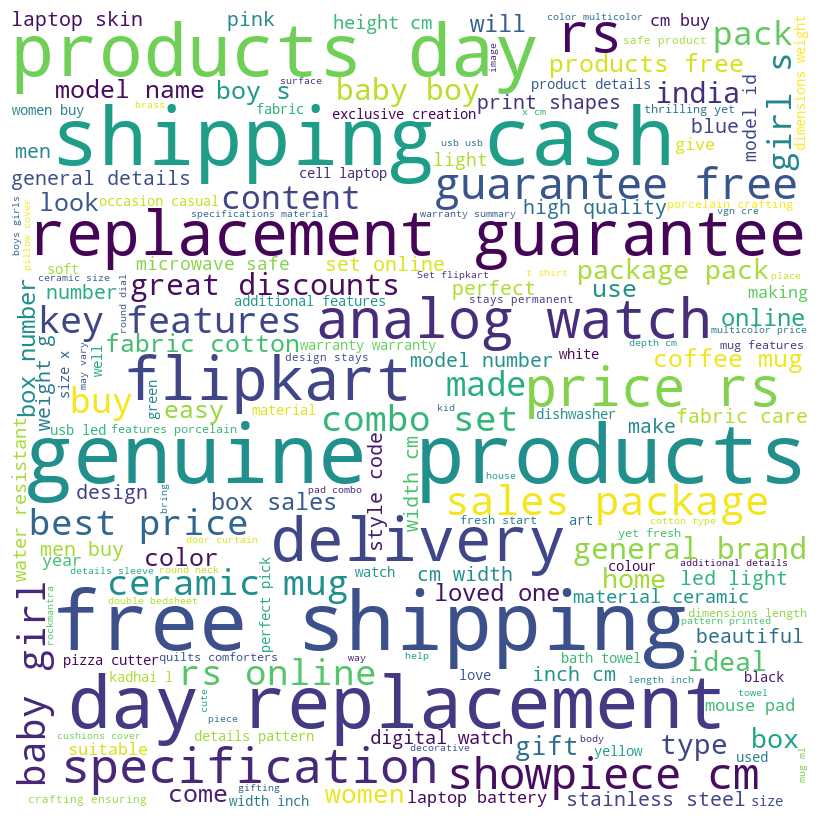

In [31]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Concaténer tous les mots dans le corpus
text = ' '.join(corpus)

# Créer un objet WordCloud
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                min_font_size = 10).generate(text)

# Afficher le WordCloud
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 

plt.show()

In [32]:
len(df['description_cleaned'][5])

22

In [33]:
len(df['description_lemmatized'][5])

22

In [34]:
#stemming
df['description_stemmed'] = df['description_cleaned'].apply(lambda x: [stemmer.stem(w) for w in x])

In [35]:
len(df['description_stemmed'][5])

22

In [36]:
len(df['description_cleaned'][5])

22

### C - Extraction Catégorie de Produit <a name=C ></a>
S'agissant d'une classification non-supervisée on ne va pas pourvoir se servir de la catégorie des produits pour effectuer le clustering. Par contre, la catégorie de produit va pouvoir nous permetttre de juger de la qualité du clustering effectué.

In [37]:
for i in range(30,50):
    print(df['product_category_tree'][i])

["Watches >> Wrist Watches >> Marvel Wrist Watches"]
["Watches >> Wrist Watches >> Lenco Wrist Watches"]
["Watches >> Wrist Watches >> D'Signer Wrist Watches"]
["Home Furnishing >> Living Room Furnishing >> Diwan Sets >> SANTOSH ROYAL FASHION Diwan Sets >> SANTOSH ROYAL FASHION Cotton Embroidered Diwan Set"]
["Home Furnishing >> Bed Linen >> Duvet Covers >> House This Duvet Covers >> House This Queen Cotton Duvet Cover (Grey)"]
["Home Furnishing >> Bath Linen >> Bath Mats"]
["Home Decor & Festive Needs >> Candles & Fragrances >> Home Fragrances >> Aroma Oils >> Myesquire Aroma Oils"]
["Kitchen & Dining >> Tableware & Cutlery >> Jug, Glass & Tray Sets >> Dungri India Craft Jug, Glass & Tray Sets >> Dungri India Craft Ducjug010-ducgl012-2 Jug Glas..."]
["Kitchen & Dining >> Lighting >> Bulbs >> BFT Bulbs >> BFT 6 W LED Bulb (White)"]
["Home Furnishing >> JMD Home Furnishing >> JMD Printed Cushions Cover (Pack of 2, 40 cm*40 ..."]
["Baby Care >> Infant Wear >> Baby Girls' Clothes >> Inner

On observe ici que la colonne 'product_category_tree' qui nous renseigne sur la catégorie du produit est sous la forme d'un "arbre". En effet, chaques catégories principale est composée de sous-catégories. De plus, on remarque que tout les arbres de catégories n'ont pas la même "profondeur". On va donc nettoyer le champ et regarder la distribution 

In [38]:
def clean_cat(string,level):
    """
    Extrait la catégorie de la string passée en entrée sachant que les strings suivent le format suivant :
        ["Cat0 >> Cat1 >> Cat2 >> CatX >> NomProduit"] 
    Paramètres :
        - string : string contenant les catégories que l'on veut extraire
        - level : niveau de la catégorie que l'on cherche à extraire 
    Retourne : La nom de la catégorie
    """
    string = string.replace('["','')
    string = string.replace('"]','')
    string = string.replace(' ','')
    str_split=string.split(">>")
    return str_split[level]

In [39]:
df['product_category_tree'][0]

'["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]'

In [40]:

def moda(df,col):
    """
    - Paramètres : 
        - Dataframe
        - Colonne du Dataframe
    - Retourne : Dataframe des modalités de la colonne et du dataframe en entrée avec leur fréquences et leurs effectifs respectifs
    """
    #on comptes le nombre de valeurs dans la colonne
    eff = df[col].value_counts() 
    #on récupères les modalités que prends la variable
    moda = eff.index 
    
    #on crée un DataFrame avec toutes les modalités de la variable
    tab_moda = pd.DataFrame(moda, columns = [col])
    #On ajoute une colonne au DataFrame contenant le nombre d'occurence de la modalité
    tab_moda["n"] = eff.values
    #on ajoute une colonne au DataFrame colculant la fréquence d'apparition de la modalité
    tab_moda["f"] = tab_moda["n"]/sum(tab_moda["n"])*100 
    return tab_moda

In [41]:
moda(pd.DataFrame(df['product_category_tree'].apply(lambda x: clean_cat(x,0))),'product_category_tree')

,product_category_tree,n,f
0,HomeFurnishing,150,14.285714
1,BabyCare,150,14.285714
2,Watches,150,14.285714
3,HomeDecor&FestiveNeeds,150,14.285714
4,Kitchen&Dining,150,14.285714
5,BeautyandPersonalCare,150,14.285714
6,Computers,150,14.285714


7 catégories parfaitement équilibrées avec 150 individus dans chaques catégories. <br>
2ème Maille :

In [42]:
sec_maille = moda(pd.DataFrame(df['product_category_tree'].apply(lambda x: clean_cat(x,1))),'product_category_tree')
sec_maille

,product_category_tree,n,f
0,WristWatches,149,14.190476
1,LaptopAccessories,87,8.285714
2,InfantWear,84,8.000000
3,CoffeeMugs,74,7.047619
4,Showpieces,71,6.761905
...,...,...,...
57,Consumables&Disposables,1,0.095238
58,TRUEHomeDecor&FestiveNeeds,1,0.095238
59,JMDHomeFurnishing,1,0.095238
60,Kripa'sHomeFurnishing,1,0.095238


In [43]:
len(sec_maille[sec_maille['f']<1])

38

Cette seconde maille est beaucoup plus déséquilibrée. On a 62 catégories avec des effectifs très variables passant de 14% pour la catégorie la plus représentée "Wrist Watches" à 8% pour la seconde "LaptopAccessories". Enfin on a 38 catégories, c'est à dire plus de la moitié, dont la fréquence est inférieure à 1%. <br>
Ce niveau de maille présente donc trop peut d'exemple de chaques catégories  pour que l'interprétation des catégories soit significative. On va donc partir sur la maille la plus grosse.

In [44]:
df['label'] = df['product_category_tree'].apply(lambda x: clean_cat(x,0))

In [45]:
df['label'].value_counts()

label
HomeFurnishing            150
BabyCare                  150
Watches                   150
HomeDecor&FestiveNeeds    150
Kitchen&Dining            150
BeautyandPersonalCare     150
Computers                 150
Name: count, dtype: int64

In [46]:
df

,uniq_id,product_name,description,product_category_tree,img_path,description_cleaned,description_lemmatized,description_stemmed,label
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,key features of elegance polyester multicolor ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,"[key, features, elegance, polyester, multicolo...","[key, feature, elegance, polyester, multicolor...","[key, featur, eleg, polyest, multicolor, abstr...",HomeFurnishing
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,specifications of sathiyas cotton bath towel b...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,"[specifications, sathiyas, cotton, bath, towel...","[specification, sathiyas, cotton, bath, towel,...","[specif, sathiya, cotton, bath, towel, bath, t...",BabyCare
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,key features of eurospa cotton terry face towe...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg,"[key, features, eurospa, cotton, terry, face, ...","[key, feature, eurospa, cotton, terry, face, t...","[key, featur, eurospa, cotton, terri, face, to...",BabyCare
3,d4684dcdc759dd9cdf41504698d737d8,SANTOSH ROYAL FASHION Cotton Printed King size...,key features of santosh royal fashion cotton p...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",d4684dcdc759dd9cdf41504698d737d8.jpg,"[key, features, santosh, royal, fashion, cotto...","[key, feature, santosh, royal, fashion, cotton...","[key, featur, santosh, royal, fashion, cotton,...",HomeFurnishing
4,6325b6870c54cd47be6ebfbffa620ec7,Jaipur Print Cotton Floral King sized Double B...,key features of jaipur print cotton floral kin...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",6325b6870c54cd47be6ebfbffa620ec7.jpg,"[key, features, jaipur, print, cotton, floral,...","[key, feature, jaipur, print, cotton, floral, ...","[key, featur, jaipur, print, cotton, floral, k...",HomeFurnishing
...,...,...,...,...,...,...,...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc,Oren Empower Extra Large Self Adhesive Sticker,oren empower extra large self adhesive sticker...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",958f54f4c46b53c8a0a9b8167d9140bc.jpg,"[oren, empower, extra, large, self, adhesive, ...","[oren, empower, extra, large, self, adhesive, ...","[oren, empow, extra, larg, self, adhes, sticke...",BabyCare
1046,fd6cbcc22efb6b761bd564c28928483c,Wallmantra Large Vinyl Sticker Sticker,wallmantra large vinyl sticker sticker pack of...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",fd6cbcc22efb6b761bd564c28928483c.jpg,"[wallmantra, large, vinyl, sticker, sticker, p...","[wallmantra, large, vinyl, sticker, sticker, p...","[wallmantra, larg, vinyl, sticker, sticker, pa...",BabyCare
1047,5912e037d12774bb73a2048f35a00009,Uberlyfe Extra Large Pigmented Polyvinyl Films...,buy uberlyfe extra large pigmented polyvinyl f...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",5912e037d12774bb73a2048f35a00009.jpg,"[uberlyfe, extra, large, pigmented, polyvinyl,...","[uberlyfe, extra, large, pigmented, polyvinyl,...","[uberlyf, extra, larg, pigment, polyvinyl, fil...",BabyCare
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,Wallmantra Medium Vinyl Sticker Sticker,buy wallmantra medium vinyl sticker sticker fo...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,"[wallmantra, medium, vinyl, sticker, sticker, ...","[wallmantra, medium, vinyl, sticker, sticker, ...","[wallmantra, medium, vinyl, sticker, sticker, ...",BabyCare


### D - Bag of Words & Tf-Idf <a name=D ></a>
On va maintenant créer un "Bag of Words" c'est à dire un ensemble de mot qui décrit chaque produit, simplement en créant une string à partir de la liste de mots de la description que l'on à nettoyé précèdement. 
Ensuite on va transformer le texte en valeurs numériques pour pouvoir effectuer notre clustering. On va effectuer cette transformation grâce à un Tf-Idf Vectorizer. <br>

Le Tf-Idf va permettre d'attribuer un poid à un mot du corpus en fonction de plusieurs critères :
- Tf : Term-Frequency c'est à dire la fréquence d'apparition du mot dans l'ensemble des description. Par exemple, le mot apparait 5 fois dans la 1ère description et 100 fois dans l'ensemble des documents, Tf = 5/100 
- Idf : Inverse Document Frequency c'est à dire l'inverse de la proportion de documents du corpus qui contiennent le terme, dont on va calculer le logarithme. Par exemple, si le terme apparait dans 20 documents sur 100 documents au total, Idf = log(100/20)

Le Tf-Idf résulte du produit Tf x Idf. Le Tf permettant de donner de l'importance aux mots qui apparaissent beaucoup mais cette métrique ne va donc pas prendre en compte les mots qui apparaissent peut mais qui pourrait rendre compte d'une particularité. C'est pour ça qu'on pondère le Tf grâce à l'Idf.

In [47]:
#Création du bag of words
df['bow_lem'] = df['description_lemmatized'].apply(lambda x: " ".join(x))
df['bow_lem']

0       key feature elegance polyester multicolor abst...
1       specification sathiyas cotton bath towel bath ...
2       key feature eurospa cotton terry face towel se...
3       key feature santosh royal fashion cotton print...
4       key feature jaipur print cotton floral king si...
                              ...                        
1045    oren empower extra large self adhesive sticker...
1046    wallmantra large vinyl sticker sticker pack r ...
1047    uberlyfe extra large pigmented polyvinyl film ...
1048    wallmantra medium vinyl sticker sticker r wall...
1049    uberlyfe large vinyl sticker r uberlyfe large ...
Name: bow_lem, Length: 1050, dtype: object

In [48]:
#Création du bag of words
df['bow_stem'] = df['description_stemmed'].apply(lambda x: " ".join(x))
df['bow_stem']

0       key featur eleg polyest multicolor abstract ey...
1       specif sathiya cotton bath towel bath towel re...
2       key featur eurospa cotton terri face towel set...
3       key featur santosh royal fashion cotton print ...
4       key featur jaipur print cotton floral king siz...
                              ...                        
1045    oren empow extra larg self adhes sticker pack ...
1046    wallmantra larg vinyl sticker sticker pack rs ...
1047    uberlyf extra larg pigment polyvinyl film impo...
1048    wallmantra medium vinyl sticker sticker rs wal...
1049    uberlyf larg vinyl sticker rs uberlyf larg vin...
Name: bow_stem, Length: 1050, dtype: object

In [49]:
df['bow_lem']

0       key feature elegance polyester multicolor abst...
1       specification sathiyas cotton bath towel bath ...
2       key feature eurospa cotton terry face towel se...
3       key feature santosh royal fashion cotton print...
4       key feature jaipur print cotton floral king si...
                              ...                        
1045    oren empower extra large self adhesive sticker...
1046    wallmantra large vinyl sticker sticker pack r ...
1047    uberlyfe extra large pigmented polyvinyl film ...
1048    wallmantra medium vinyl sticker sticker r wall...
1049    uberlyfe large vinyl sticker r uberlyfe large ...
Name: bow_lem, Length: 1050, dtype: object

In [50]:
corpus=[]
    
for x in df['bow_lem'].str.split():
    for i in x:
        corpus.append(i)

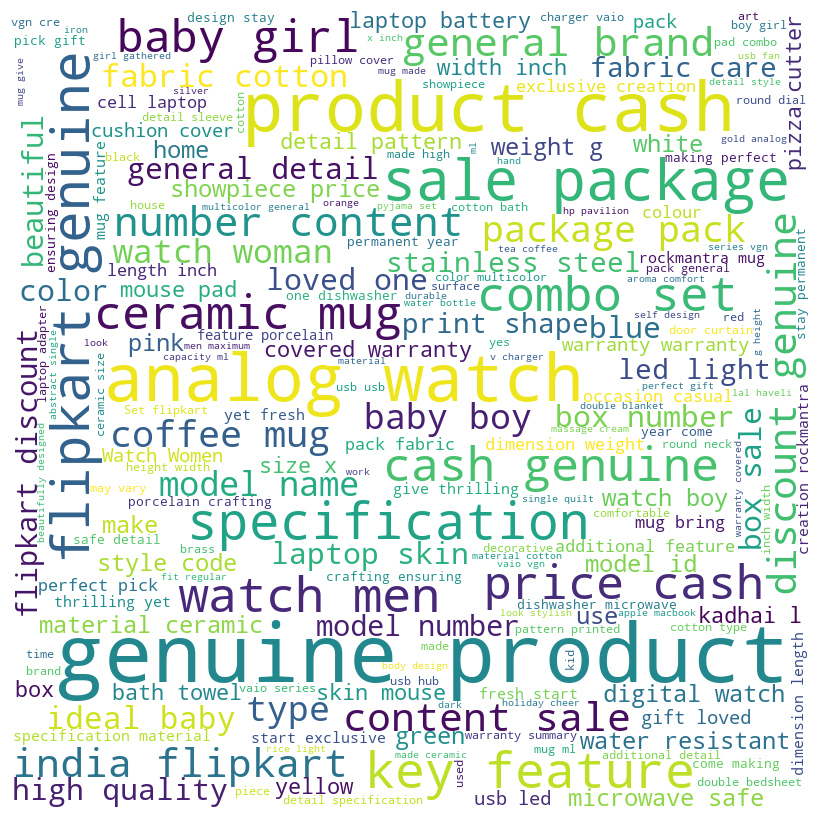

In [51]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Concaténer tous les mots dans le corpus
text = ' '.join(corpus)

# Créer un objet WordCloud
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                min_font_size = 10).generate(text)

# Afficher le WordCloud
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 

plt.show()


Il ya des mots fréquents mais inutile pour la classification. on va voir les top 30.

In [52]:
#%pip install plotly

In [53]:
import plotly.express as px


dic=defaultdict(int)
for word in corpus:
   dic[word]+=1

top=sorted(dic.items(), key=lambda x:x[1],reverse=True)[:30] 
x,y=zip(*top)
fig=px.bar(x=x,y=y)
fig.update_layout(title={
        'text': "Mots les plus utilisés pour le StopWords",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},xaxis_title='Mots utilisés',yaxis_title='Frequency')

In [54]:
# Labelisation des catégories de produits
from sklearn import preprocessing


encode = preprocessing.LabelEncoder()
df['label'] = encode.fit_transform(np.array(df['label']))

df.head(3)

,uniq_id,product_name,description,product_category_tree,img_path,description_cleaned,description_lemmatized,description_stemmed,label,bow_lem,bow_stem
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,key features of elegance polyester multicolor ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,"[key, features, elegance, polyester, multicolo...","[key, feature, elegance, polyester, multicolor...","[key, featur, eleg, polyest, multicolor, abstr...",4,key feature elegance polyester multicolor abst...,key featur eleg polyest multicolor abstract ey...
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,specifications of sathiyas cotton bath towel b...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,"[specifications, sathiyas, cotton, bath, towel...","[specification, sathiyas, cotton, bath, towel,...","[specif, sathiya, cotton, bath, towel, bath, t...",0,specification sathiyas cotton bath towel bath ...,specif sathiya cotton bath towel bath towel re...
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,key features of eurospa cotton terry face towe...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg,"[key, features, eurospa, cotton, terry, face, ...","[key, feature, eurospa, cotton, terry, face, t...","[key, featur, eurospa, cotton, terri, face, to...",0,key feature eurospa cotton terry face towel se...,key featur eurospa cotton terri face towel set...


Text(0.5, 1.0, 'Analyse des valeurs manquantes')

<Figure size 200x400 with 0 Axes>

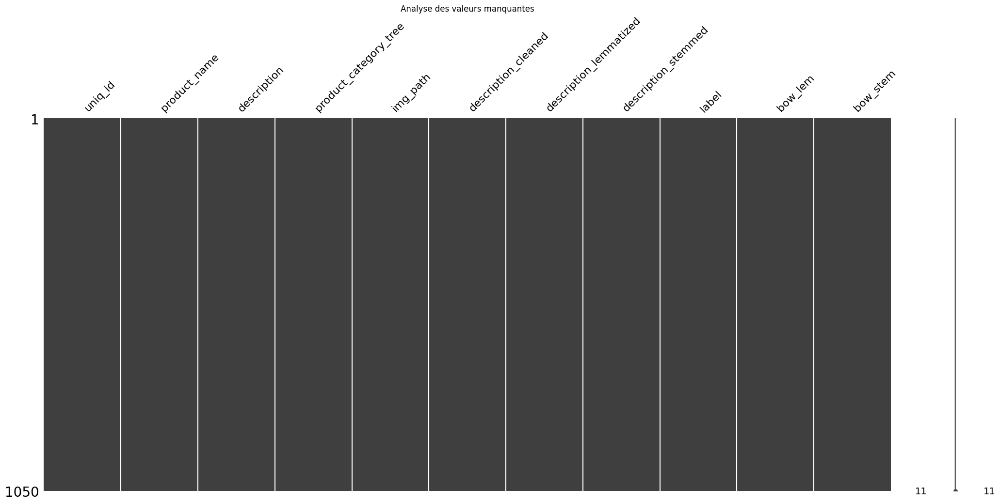

In [55]:
plt.figure(figsize = (2,4))
msno.matrix(df)
plt.title('Analyse des valeurs manquantes')

### 1.   Approche Word2Vec

Word2vec est un groupe de modèles utilisé pour le plongement lexical (word embedding). Ces modèles ont été développés par une équipe de recherche chez Google. Ce sont des réseaux de neurones artificiels à deux couches entraînés pour reconstruire le contexte linguistique des mots.


Le modèle CountVectorizer permet de transformer un texte en un vecteur de fréquences de mots. Il crée un vocabulaire à partir des mots présents dans le texte et compte le nombre d'occurrences de chaque mot dans chaque document. Ainsi, chaque document est représenté par un vecteur de taille égale au nombre de mots dans le vocabulaire, où chaque élément du vecteur représente le nombre d'occurrences du mot correspondant dans le document. Le modèle CountVectorizer est très utile pour les tâches de classification de texte telles que la détection de spam ou la classification de documents.

Le modèle TF-IDF (Term Frequency-Inverse Document Frequency) est une méthode similaire au CountVectorizer, mais il prend également en compte la fréquence des mots dans le corpus global. Le TF-IDF mesure l'importance relative d'un mot dans un document en multipliant la fréquence d'apparition du mot dans le document (TF) par l'inverse de sa fréquence d'apparition dans tous les documents du corpus (IDF). Cela permet de mettre en évidence les mots qui sont fréquents dans un document mais peu fréquents dans l'ensemble du corpus, ce qui peut aider à identifier des mots-clés importants dans un document. Le modèle TF-IDF est souvent utilisé pour la recherche d'information, l'extraction de mots-clés et la recommandation de contenu personnalisé.

In [56]:

# Analyse et modélisation texte
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.metrics import classification_report,confusion_matrix

In [57]:
#Extraction des features avec Tf-Idf Vectorizer : min_df=0.01,max_df=0.8 
tfidf_lem = TfidfVectorizer(min_df=0.01,max_df=0.99)


values_lem = tfidf_lem.fit_transform(df['bow_lem'])


In [58]:
values_lem.shape

(1050, 493)

In [59]:
# Création du nombre de catégories pour les clusters
n_clusters = list(df.label.unique())

# Création de la feature
y_feature = df['label']

# Création des méthodes Count et tfifd vectorizer
vector = CountVectorizer()
vectorizer = TfidfVectorizer()

feat = 'bow_lem'
vect_fit = vector.fit(df[feat])
tf_vectorizer_fit = vectorizer.fit(df[feat])

vect_transform = vector.transform(df[feat])  
tf_vectorizer_transform = vectorizer.transform(df[feat])  

print(vect_transform.shape)
print(tf_vectorizer_transform.shape)

(1050, 4752)
(1050, 4752)


Nous allons à présent utilisé la méthode du TSNE afin de pouvoir visualiser nos clusters.

Afin d'analyser nos données, nous allons prendre la décision d'indiquer 7 clusters du fait de la présence de 7 catégories.

In [60]:
# Calcul Tsne, détermination des clusters et calcul ARI entre vrais catégorie et n° de clusters
import time
from sklearn import manifold
from sklearn import cluster
from sklearn import metrics

def ARI_fct(features) :
    time1 = time.time()
    # Création du nombre de catégories pour les clusters
    n_clusters = list(df.label.unique())
    # Nous allons déterminer le nombre de clusters
    labels=len(n_clusters)

    tsne = manifold.TSNE(n_components=2, learning_rate=200, init='random', random_state=100)
    
    X_tsne = tsne.fit_transform(features)


    # Détermination des clusters à partir des données après Tsne 
    cls = cluster.KMeans(n_clusters=labels, init='k-means++',random_state=100)
    cls.fit(X_tsne)
    ARI = np.round(metrics.adjusted_rand_score(y_feature, cls.labels_),4)
    time2 = np.round(time.time() - time1,0)
    print("ARI : ", ARI, "Temps d'exécution : ", time2)
    
    return ARI, X_tsne, cls.labels_

In [61]:
import time
from sklearn.cluster import Birch
from sklearn import manifold
from sklearn import metrics
import numpy as np

def ARI_fct_Birch(features):
    time1 = time.time()

    # Réduction de dimension avec t-SNE
    tsne = manifold.TSNE(n_components=2, learning_rate=200, init='random', random_state=100)
    X_tsne = tsne.fit_transform(features)

    # Détermination des clusters avec BIRCH  brc = Birch(branching_factor=70, n_clusters=7, threshold=0.05, compute_labels=True)
    brc = Birch(branching_factor=100, n_clusters=7, threshold=0.9, compute_labels=True)
    cls_labels = brc.fit_predict(X_tsne)

    # Calcul de l'ARI
    ARI = np.round(metrics.adjusted_rand_score(y_feature, cls_labels), 4)

    time2 = np.round(time.time() - time1, 0)
    print("ARI: ", ARI, "Temps d'exécution: ", time2)

    return ARI, X_tsne, cls_labels


In [62]:
# visualisation du Tsne selon les vraies catégories et selon les clusters
'''def visu_TSNE(X_tsne, y_true, labels, ARI) :
    fig = plt.figure(figsize=(15,6))
    
    ax = fig.add_subplot(121)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=y_feature)
    #cmap='Set1'
    ax.legend(handles=scatter.legend_elements()[0], labels=n_clusters, loc="best", title="Categorie")
    plt.title('Catégories réelles')
    
    ax = fig.add_subplot(122)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=labels)
    ax.legend(handles=scatter.legend_elements()[0], labels=set(labels), loc="best", title="Clusters")
    plt.title('Clusters')
    
    plt.show()
    print("ARI : ", ARI)'''

'def visu_TSNE(X_tsne, y_true, labels, ARI) :\n    fig = plt.figure(figsize=(15,6))\n    \n    ax = fig.add_subplot(121)\n    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=y_feature)\n    #cmap=\'Set1\'\n    ax.legend(handles=scatter.legend_elements()[0], labels=n_clusters, loc="best", title="Categorie")\n    plt.title(\'Catégories réelles\')\n    \n    ax = fig.add_subplot(122)\n    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=labels)\n    ax.legend(handles=scatter.legend_elements()[0], labels=set(labels), loc="best", title="Clusters")\n    plt.title(\'Clusters\')\n    \n    plt.show()\n    print("ARI : ", ARI)'

In [63]:
# visualisation du Tsne selon les vraies catégories et selon les clusters
def visu_TSNE(X_tsne, y_true, labels, ARI) :
    fig = plt.figure(figsize=(15, 6))
    
    ax = fig.add_subplot(121)
    scatter_true = ax.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y_true)
    legend_true = ax.legend(*scatter_true.legend_elements(), loc="best", title="Categorie")
    ax.add_artist(legend_true)
    plt.title('Catégories réelles')
    
    ax = fig.add_subplot(122)
    scatter_clusters = ax.scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels)
    legend_clusters = ax.legend(*scatter_clusters.legend_elements(), loc="best", title="Clusters")
    ax.add_artist(legend_clusters)
    plt.title('Clusters')
    
    plt.show()
    print("ARI : ", ARI)


Utilisation de la méthode CountVectorizer : 
-----------------


ARI:  0.4182 Temps d'exécution:  3.0


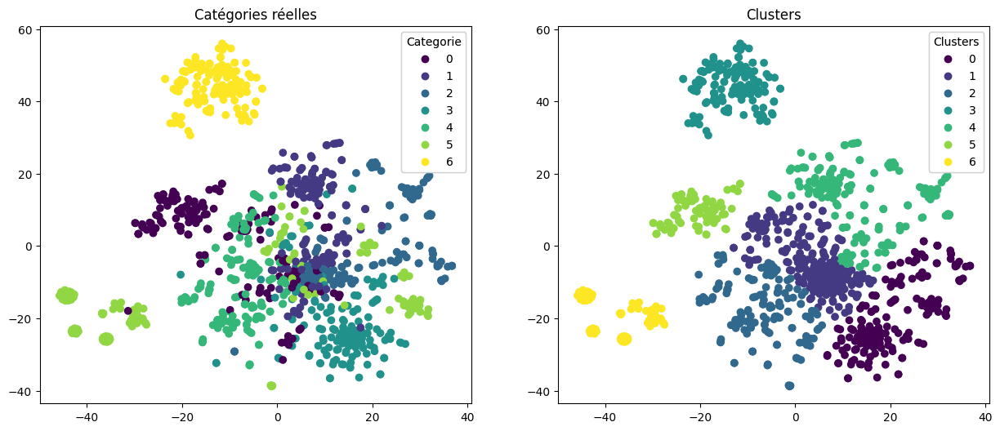

ARI :  0.4182


In [64]:
print("Utilisation de la méthode CountVectorizer : ")
print("-----------------")
ARI, X_tsne, labels = ARI_fct_Birch(vect_transform)
visu_TSNE(X_tsne, y_feature, labels, ARI)

In [65]:
import time
from sklearn.cluster import DBSCAN
from sklearn import manifold
from sklearn import metrics
import numpy as np

def ARI_fct_DBSCAN(features):
    time1 = time.time()

    # Réduction de dimension avec t-SNE
    tsne = manifold.TSNE(n_components=2, learning_rate=200, init='random', random_state=100)
    X_tsne = tsne.fit_transform(features)

    # Détermination des clusters avec DBSCAN
    dbscan = DBSCAN(eps=3.6, min_samples=7)
    cls_labels = dbscan.fit_predict(X_tsne)

    # Calcul de l'ARI
    ARI = np.round(metrics.adjusted_rand_score(y_feature, cls_labels), 4)

    time2 = np.round(time.time() - time1, 0)
    print("ARI: ", ARI, "Temps d'exécution: ", time2)

    return ARI, X_tsne, cls_labels


In [66]:
from sklearn.mixture import GaussianMixture

def ARI_fct_GMM(features):
    time1 = time.time()

    # Réduction de dimension avec t-SNE
    tsne = manifold.TSNE(n_components=2, learning_rate=200, init='random', random_state=100)
    X_tsne = tsne.fit_transform(features)

    # Détermination des clusters avec GMM
    gmm = GaussianMixture(n_components=7, random_state=100)
    cls_labels = gmm.fit_predict(X_tsne)

    # Calcul de l'ARI
    ARI = np.round(metrics.adjusted_rand_score(y_feature, cls_labels), 4)

    time2 = np.round(time.time() - time1, 0)
    print("ARI: ", ARI, "Temps d'exécution: ", time2)

    return ARI, X_tsne, cls_labels


Utilisation de la méthode Tf-idf : 
--------


ARI:  0.5017 Temps d'exécution:  2.0


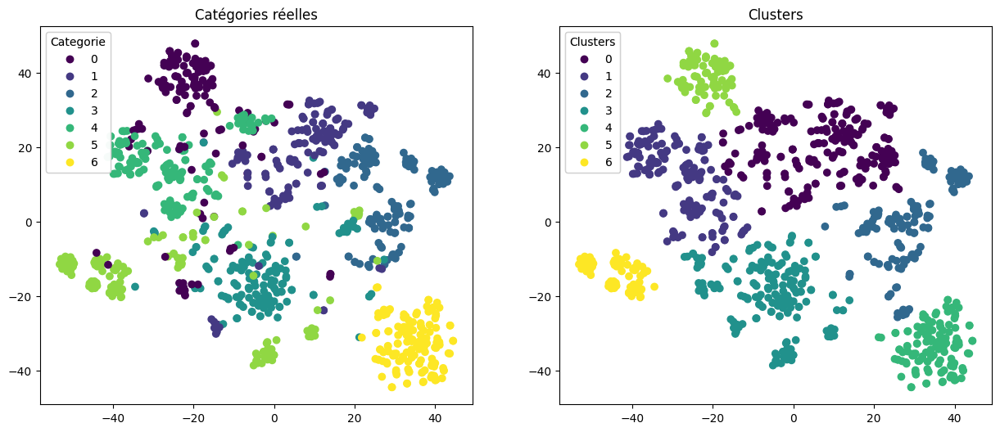

ARI :  0.5017


In [67]:
print("Utilisation de la méthode Tf-idf : ")
print("--------")
ARI, X_tsne, labels = ARI_fct_Birch(tf_vectorizer_transform)
visu_TSNE(X_tsne, y_feature, labels, ARI)

Nous avons constaté que la modélisation de nos deux modèles présentent des scores assez différents entre 0.42 pour la méthode du CountVectorizer et 0.488 pour la méthode TF-IDF.

La seconde méthode présentant les meilleurs résultats. Il sera intéressant de conserver ce modèle.

La méthode BERT (Bidirectional Encoder Representations from Transformers) est un modèle créé par Google en 2018.

In [68]:
df['bow_lem']

0       key feature elegance polyester multicolor abst...
1       specification sathiyas cotton bath towel bath ...
2       key feature eurospa cotton terry face towel se...
3       key feature santosh royal fashion cotton print...
4       key feature jaipur print cotton floral king si...
                              ...                        
1045    oren empower extra large self adhesive sticker...
1046    wallmantra large vinyl sticker sticker pack r ...
1047    uberlyfe extra large pigmented polyvinyl film ...
1048    wallmantra medium vinyl sticker sticker r wall...
1049    uberlyfe large vinyl sticker r uberlyfe large ...
Name: bow_lem, Length: 1050, dtype: object

In [69]:
df['bow_lem']


0       key feature elegance polyester multicolor abst...
1       specification sathiyas cotton bath towel bath ...
2       key feature eurospa cotton terry face towel se...
3       key feature santosh royal fashion cotton print...
4       key feature jaipur print cotton floral king si...
                              ...                        
1045    oren empower extra large self adhesive sticker...
1046    wallmantra large vinyl sticker sticker pack r ...
1047    uberlyfe extra large pigmented polyvinyl film ...
1048    wallmantra medium vinyl sticker sticker r wall...
1049    uberlyfe large vinyl sticker r uberlyfe large ...
Name: bow_lem, Length: 1050, dtype: object

In [70]:
df['description_cleaned']

0       [key, features, elegance, polyester, multicolo...
1       [specifications, sathiyas, cotton, bath, towel...
2       [key, features, eurospa, cotton, terry, face, ...
3       [key, features, santosh, royal, fashion, cotto...
4       [key, features, jaipur, print, cotton, floral,...
                              ...                        
1045    [oren, empower, extra, large, self, adhesive, ...
1046    [wallmantra, large, vinyl, sticker, sticker, p...
1047    [uberlyfe, extra, large, pigmented, polyvinyl,...
1048    [wallmantra, medium, vinyl, sticker, sticker, ...
1049    [uberlyfe, large, vinyl, sticker, rs, uberlyfe...
Name: description_cleaned, Length: 1050, dtype: object

In [71]:
# Fonction pour transformer une liste en chaîne de caractères sans virgule
def list_to_string(lst):
    return ' '.join(map(str, lst))

# Appliquer la transformation à la colonne spécifique (col2 dans cet exemple)
df['sentences_cleaned'] = df['description_cleaned'].apply(list_to_string)

In [72]:
df['sentences_cleaned']

0       key features elegance polyester multicolor abs...
1       specifications sathiyas cotton bath towel bath...
2       key features eurospa cotton terry face towel s...
3       key features santosh royal fashion cotton prin...
4       key features jaipur print cotton floral king s...
                              ...                        
1045    oren empower extra large self adhesive sticker...
1046    wallmantra large vinyl sticker sticker pack rs...
1047    uberlyfe extra large pigmented polyvinyl films...
1048    wallmantra medium vinyl sticker sticker rs wal...
1049    uberlyfe large vinyl sticker rs uberlyfe large...
Name: sentences_cleaned, Length: 1050, dtype: object

In [73]:
from transformers import AutoTokenizer, TFAutoModel
tokenizer = AutoTokenizer.from_pretrained("t5-base")

In [74]:
def featTxt_WE_bert(data):
    
    # Création des phrases
    sentences = data['sentences_cleaned'].values
    sentences = [x for x in sentences]
    batch_size = 10
    max_length = 64
    model_type = 'bert-base-uncased'
    bert_tokenizer = AutoTokenizer.from_pretrained(model_type)
    time1 = time.time()
    model = TFAutoModel.from_pretrained(model_type)


    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        
        input_ids = []
        token_type_ids = []
        attention_mask = []

        for sent in sentences[idx:idx+batch_size]:
           

            bert_inp = bert_tokenizer.encode_plus(sent,
                                                  add_special_tokens = True,
                                                  max_length = max_length,
                                                  padding = 'max_length',
                                                  return_attention_mask = True, 
                                                  return_token_type_ids = True,
                                                  truncation = True,
                                                  return_tensors = "tf"
                                                )

            input_ids.append(bert_inp['input_ids'][0])
            token_type_ids.append(bert_inp['token_type_ids'][0])
            attention_mask.append(bert_inp['attention_mask'][0])

        input_ids = np.asarray(input_ids)
        token_type_ids = np.asarray(token_type_ids)
        attention_mask = np.array(attention_mask)
        
        text_preprocessed = {"input_ids" : input_ids, 
                             "attention_mask" : attention_mask, 
                             "token_type_ids" : token_type_ids}
        outputs = model(text_preprocessed)
        last_hidden_states = outputs[0]
             
        if step ==0 :
            last_hidden_states_tot = last_hidden_states
            last_hidden_states_tot_0 = last_hidden_states
        else :
            last_hidden_states_tot = np.concatenate((last_hidden_states_tot,last_hidden_states))
    
    features_bert = np.array(last_hidden_states_tot).mean(axis=1)
    
    time2 = np.round(time.time() - time1,0)
    print("temps traitement : ", time2)  
    
    
    return features_bert

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

temps traitement :  66.0
ARI:  0.3225 Temps d'exécution:  2.0


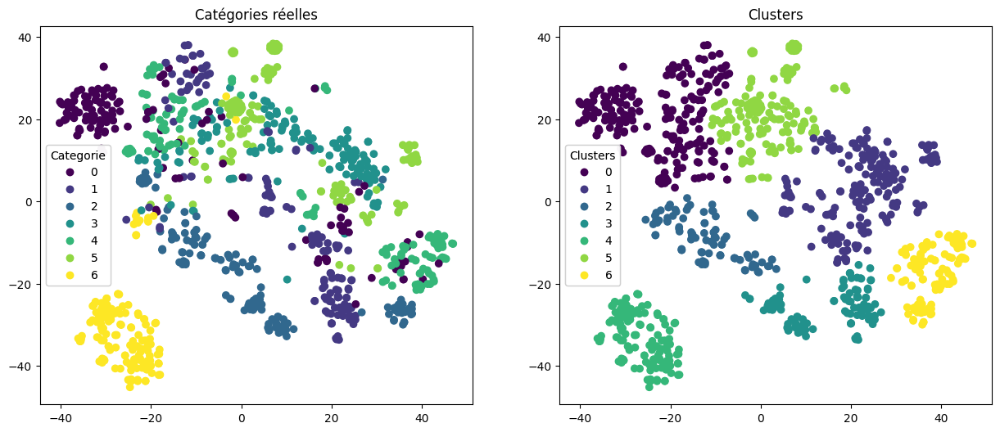

ARI :  0.3225


In [75]:

features_bert = featTxt_WE_bert(df)

ARI, X_tsne, labels = ARI_fct_Birch(features_bert)

visu_TSNE(X_tsne, y_feature, labels, ARI)

In [76]:
import numpy as np
from scipy.optimize import linear_sum_assignment
from sklearn.metrics import adjusted_rand_score,jaccard_score,fowlkes_mallows_score

# Supposons que labels_algo1 et labels_algo2 sont les labels des clusters résultant des deux algorithmes
labels_algo1 =df['label']
labels_algo2 = labels

# Créer une matrice de coût basée sur la similarité entre les clusters
unique_labels_algo1 = np.unique(labels_algo1)
unique_labels_algo2 = np.unique(labels_algo2)

cost_matrix = np.zeros((len(unique_labels_algo1), len(unique_labels_algo2)))

for i, label_algo1 in enumerate(unique_labels_algo1):
    for j, label_algo2 in enumerate(unique_labels_algo2):
        intersection_size = np.sum((labels_algo1 == label_algo1) & (labels_algo2 == label_algo2))
        cost_matrix[i, j] = -intersection_size  # Convertir en problème de minimisation

# Appliquer l'algorithme de correspondance de Hungarian
row_indices, col_indices = linear_sum_assignment(cost_matrix)

# Obtenir les correspondances optimales
correspondences = [(unique_labels_algo1[i], unique_labels_algo2[j]) for i, j in zip(row_indices, col_indices)]

# Mapper les clusters
mapped_labels_algo2 = np.array([next(label_algo2 for label_algo2, mapped_label_algo1 in correspondences if mapped_label_algo1 == label_algo1) for label_algo1 in labels_algo1])

# Évaluer la qualité de la correspondance
ari_after_mapping = adjusted_rand_score(labels_algo1, mapped_labels_algo2)
print(f"ARI après correspondance : {ari_after_mapping}")
# Jaccard Index
jaccard = jaccard_score(labels_algo1, mapped_labels_algo2, average='micro')
print(f"Jaccard Index : {jaccard}")

# Fowlkes-Mallows
fm = fowlkes_mallows_score(labels_algo1, mapped_labels_algo2)
print(f"Fowlkes-Mallows Score : {fm}")


ARI après correspondance : 1.0
Jaccard Index : 0.2727272727272727
Fowlkes-Mallows Score : 1.0


### 3. Approche USE

In [77]:
import tensorflow_hub as hub
import tensorflow as tf
import tensorflow.keras
imp_modèle = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

In [78]:


def feature_USE_fct(sentences, b_size) :
    batch_size = b_size
    time3 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        feat = imp_modèle(sentences[idx:idx+batch_size])

        if step ==0 :
            features = feat
        else :
            features = np.concatenate((features,feat))

    time2 = np.round(time.time() - time3,0)
    return features

In [79]:
df['sentences_cleaned'].to_list()

['key features elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain height pack rs curtain enhances look interiors curtain made high quality polyester fabric features eyelet style stitch metal ring makes room environment romantic loving curtain ant wrinkle anti shrinkage elegant apparance give home bright modernistic appeal designs surreal attention sure steal hearts contemporary eyelet valance curtains slide smoothly draw apart first thing morning welcome bright sun rays want wish good morning whole world draw close evening create special moments joyous beauty given soothing prints bring home elegant curtain softly filters light room get right amount sunlight specifications elegance polyester multicolor abstract eyelet door curtain height pack general brand elegance designed door type eyelet model name abstract polyester door curtain set model id duster color multicolor dimensions length box number content

ARI :  0.454 Temps d'exécution :  2.0


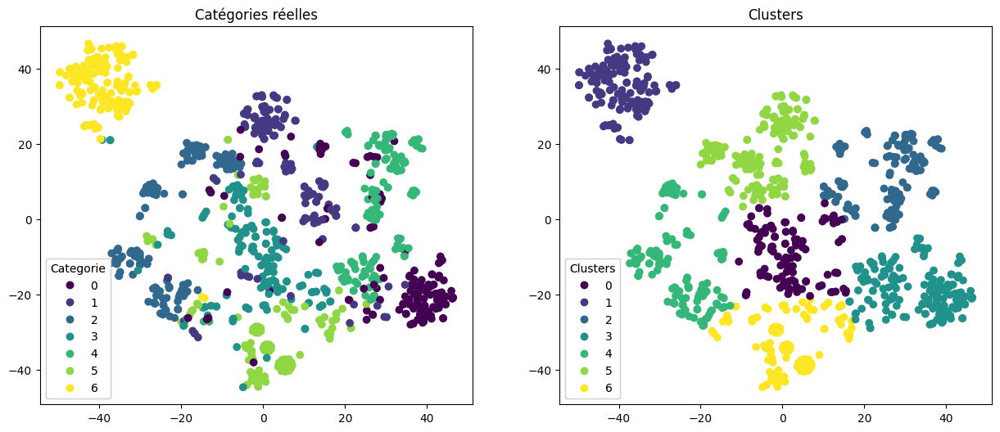

ARI :  0.454


In [80]:
sentences =  df['sentences_cleaned'].to_list()
batch_size = 10
features_USE = feature_USE_fct(sentences, batch_size)

ARI, X_tsne, labels = ARI_fct(features_USE)

visu_TSNE(X_tsne, y_feature, labels, ARI)

### 4. Approche supervisé comme echelle de grandeur pour verifier l 'accuracy 


In [81]:
#Extraction des features avec Tf-Idf Vectorizer : min_df=0.01,max_df=0.8 
tfidf_lem = TfidfVectorizer(min_df=0.01,max_df=0.8)
tfidf_stem = TfidfVectorizer(min_df=0.01,max_df=0.8)

values_lem = tfidf_lem.fit_transform(df['bow_lem'])
values_stem = tfidf_stem.fit_transform(df['bow_stem'])

On va fixer des paramètres de min_df et max_df :
- min_df : seuil de document frequency, c'est a dire que l'on fixe un minimum de document dans lequel le mot doit apparaitre pour le conserver
- max_df : limite de document frequency, c'est le maximum de document dans lequel on veut que le mot apparaisse pour le conserver

In [82]:
values_tfidf_lem = pd.DataFrame(values_lem.toarray())
values_tfidf_lem

,0,1,2,3,4,5,6,7,8,9,...,483,484,485,486,487,488,489,490,491,492
0,0.225862,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.059557,0.0,0.000000,0.00000,0.000000,0.0
1,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.17421,0.068266,0.0
2,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.046733,0.00000,0.000000,0.0
3,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.00000,0.045117,0.0
4,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.00000,0.037355,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.00000,0.000000,0.0
1046,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.130823,0.0,0.000000,0.00000,0.000000,0.0
1047,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.00000,0.000000,0.0
1048,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.00000,0.000000,0.0


In [83]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the target variable
y_encoded = label_encoder.fit_transform(df['label'])
# Assuming df_train is your original dataframe
X_train, X_temp, y_train, y_temp = train_test_split(values_tfidf_lem
    ,
    y_encoded,
    test_size=0.33,
    random_state=42
)

# Further split X_temp and y_temp into validation and test sets
X_val, X_test, y_val, y_test = train_test_split(
    X_temp,
    y_temp,
    test_size=0.5,  # Assuming you want an equal split for validation and test
    random_state=42
)


# Convertissez vos tableaux NumPy en DataFrames
df_X_train = pd.DataFrame(X_train)
df_y_train = pd.DataFrame(y_train)
df_X_val = pd.DataFrame(X_val)
df_y_val = pd.DataFrame(y_val)
df_X_test = pd.DataFrame(X_test)
df_y_test = pd.DataFrame(y_test)




In [84]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder





# Create a pipeline with StandardScaler, PCA, and LogisticRegression
pipeline = Pipeline([
    ('scaler', StandardScaler(with_mean=False)),  # Scaling is important for PCA
    ('pca', PCA(n_components=45)),
    ('clf', LogisticRegression(multi_class='ovr'))  # Use 'ovr' for one-vs-rest
])

# Train and evaluate the model
pipeline.fit(X_train, y_train)

# Make predictions on the test set
yhat = pipeline.predict(X_val)

# Score
decoded_y_val = label_encoder.inverse_transform(y_val)
decoded_yhat = label_encoder.inverse_transform(yhat)

print("Accuracy: ", accuracy_score(decoded_y_val, decoded_yhat))


Accuracy:  0.8786127167630058


In [85]:

# Make predictions on the test set
yhat = pipeline.predict(X_test)

# Score
decoded_y_test = label_encoder.inverse_transform(y_test)
decoded_yhat = label_encoder.inverse_transform(yhat)

print("Accuracy: ", accuracy_score(decoded_y_test, decoded_yhat))

Accuracy:  0.8850574712643678


In [86]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.manifold import Isomap
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder
import warnings

# Filter FutureWarnings related to is_sparse
warnings.filterwarnings("ignore", category=FutureWarning, module="sklearn.utils.validation")


# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the target variable
y_encoded = label_encoder.fit_transform(df['label'])

# Split test and train
X_train, X_test, y_train, y_test = train_test_split(values_tfidf_lem, y_encoded, test_size=0.33, random_state=42)


# Create a pipeline with StandardScaler, Isomap, and LogisticRegression
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('isomap', Isomap(n_components=45,n_neighbors=10)),  # Adjust the number of components as needed
    ('clf', LogisticRegression(multi_class='ovr', solver='sag', max_iter=10000))
])

# Train and evaluate the model
pipeline.fit(X_train, y_train)

# Make predictions on the test set
yhat = pipeline.predict(X_val)

# Score
decoded_y_val = label_encoder.inverse_transform(y_val)
decoded_yhat = label_encoder.inverse_transform(yhat)

print("Accuracy: ", accuracy_score(decoded_y_val, decoded_yhat))


Accuracy:  0.8034682080924855


In [87]:
# Make predictions on the test set
yhat = pipeline.predict(X_test)

# Score
decoded_y_test = label_encoder.inverse_transform(y_test)
decoded_yhat = label_encoder.inverse_transform(yhat)

print("Accuracy: ", accuracy_score(decoded_y_test, decoded_yhat))

Accuracy:  0.8040345821325648


In [88]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder
from umap import UMAP

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the target variable
y_encoded = label_encoder.fit_transform(df['label'])

# Split test and train
X_train, X_test, y_train, y_test = train_test_split(values_tfidf_lem, y_encoded, test_size=0.33, random_state=42)

# Create a pipeline with StandardScaler, UMAP, and LogisticRegression
pipeline = Pipeline([
    ('scaler', StandardScaler(with_mean=False)),  # Scaling is important for UMAP
    ('umap', UMAP(n_components=45)),
    ('clf', LogisticRegression(multi_class='ovr', max_iter=1000))  # Increase max_iter
])

# Train and evaluate the model
pipeline.fit(X_train, y_train)


# Make predictions on the test set
yhat = pipeline.predict(X_val)

# Score
decoded_y_val = label_encoder.inverse_transform(y_val)
decoded_yhat = label_encoder.inverse_transform(yhat)

print("Accuracy: ", accuracy_score(decoded_y_val, decoded_yhat))



Accuracy:  0.7052023121387283


In [89]:
# Make predictions on the test set
yhat = pipeline.predict(X_test)

# Score
decoded_y_test = label_encoder.inverse_transform(y_test)
decoded_yhat = label_encoder.inverse_transform(yhat)

print("Accuracy: ", accuracy_score(decoded_y_test, decoded_yhat))

Accuracy:  0.7060518731988472


In [90]:
# Assuming id_to_label is a dictionary that maps numerical IDs to labels
label_to_id = {"Kitchen&Dining": 0, "BeautyandPersonalCare": 1, "BabyCare": 2, "Watches": 3, "HomeDecor&FestiveNeeds": 4, "HomeFurnishing": 5, "Computers": 6}
# Créer le dictionnaire inverse id_to_label
id_to_label = {v: k for k, v in label_to_id.items()}

In [91]:
df

,uniq_id,product_name,description,product_category_tree,img_path,description_cleaned,description_lemmatized,description_stemmed,label,bow_lem,bow_stem,sentences_cleaned
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,key features of elegance polyester multicolor ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,"[key, features, elegance, polyester, multicolo...","[key, feature, elegance, polyester, multicolor...","[key, featur, eleg, polyest, multicolor, abstr...",4,key feature elegance polyester multicolor abst...,key featur eleg polyest multicolor abstract ey...,key features elegance polyester multicolor abs...
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,specifications of sathiyas cotton bath towel b...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,"[specifications, sathiyas, cotton, bath, towel...","[specification, sathiyas, cotton, bath, towel,...","[specif, sathiya, cotton, bath, towel, bath, t...",0,specification sathiyas cotton bath towel bath ...,specif sathiya cotton bath towel bath towel re...,specifications sathiyas cotton bath towel bath...
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,key features of eurospa cotton terry face towe...,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg,"[key, features, eurospa, cotton, terry, face, ...","[key, feature, eurospa, cotton, terry, face, t...","[key, featur, eurospa, cotton, terri, face, to...",0,key feature eurospa cotton terry face towel se...,key featur eurospa cotton terri face towel set...,key features eurospa cotton terry face towel s...
3,d4684dcdc759dd9cdf41504698d737d8,SANTOSH ROYAL FASHION Cotton Printed King size...,key features of santosh royal fashion cotton p...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",d4684dcdc759dd9cdf41504698d737d8.jpg,"[key, features, santosh, royal, fashion, cotto...","[key, feature, santosh, royal, fashion, cotton...","[key, featur, santosh, royal, fashion, cotton,...",4,key feature santosh royal fashion cotton print...,key featur santosh royal fashion cotton print ...,key features santosh royal fashion cotton prin...
4,6325b6870c54cd47be6ebfbffa620ec7,Jaipur Print Cotton Floral King sized Double B...,key features of jaipur print cotton floral kin...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",6325b6870c54cd47be6ebfbffa620ec7.jpg,"[key, features, jaipur, print, cotton, floral,...","[key, feature, jaipur, print, cotton, floral, ...","[key, featur, jaipur, print, cotton, floral, k...",4,key feature jaipur print cotton floral king si...,key featur jaipur print cotton floral king siz...,key features jaipur print cotton floral king s...
...,...,...,...,...,...,...,...,...,...,...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc,Oren Empower Extra Large Self Adhesive Sticker,oren empower extra large self adhesive sticker...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",958f54f4c46b53c8a0a9b8167d9140bc.jpg,"[oren, empower, extra, large, self, adhesive, ...","[oren, empower, extra, large, self, adhesive, ...","[oren, empow, extra, larg, self, adhes, sticke...",0,oren empower extra large self adhesive sticker...,oren empow extra larg self adhes sticker pack ...,oren empower extra large self adhesive sticker...
1046,fd6cbcc22efb6b761bd564c28928483c,Wallmantra Large Vinyl Sticker Sticker,wallmantra large vinyl sticker sticker pack of...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",fd6cbcc22efb6b761bd564c28928483c.jpg,"[wallmantra, large, vinyl, sticker, sticker, p...","[wallmantra, large, vinyl, sticker, sticker, p...","[wallmantra, larg, vinyl, sticker, sticker, pa...",0,wallmantra large vinyl sticker sticker pack r ...,wallmantra larg vinyl sticker sticker pack rs ...,wallmantra large vinyl sticker sticker pack rs...
1047,5912e037d12774bb73a2048f35a00009,Uberlyfe Extra Large Pigmented Polyvinyl Films...,buy u

In [120]:
from sklearn.model_selection import train_test_split
# Initialize LabelEncoder

# Assuming df_train is your original dataframe
X_train, X_temp, y_train, y_temp = train_test_split(df[['product_name','description','img_path']]
    ,
    df['categ'],
    test_size=0.33,
    random_state=42
)

# Further split X_temp and y_temp into validation and test sets
X_val, X_test, y_val, y_test = train_test_split(
    X_temp,
    y_temp,
    test_size=0.5,  # Assuming you want an equal split for validation and test
    random_state=42
)


# Convertissez vos tableaux NumPy en DataFrames
df_X_train = pd.DataFrame(X_train)
df_y_train = pd.DataFrame(y_train)
df_X_val = pd.DataFrame(X_val)
df_y_val = pd.DataFrame(y_val)
df_X_test = pd.DataFrame(X_test)
df_y_test = pd.DataFrame(y_test)
# Renommer la colonne 'coteg' en 'label'
df_y_train.rename(columns={'categ': 'label'}, inplace=True)
# Renommer la colonne 'coteg' en 'label'
df_y_test.rename(columns={'categ': 'label'}, inplace=True)
# Renommer la colonne 'coteg' en 'label'
df_y_val.rename(columns={'categ': 'label'}, inplace=True)
# Enregistrez les DataFrames en tant que fichiers CSV
df_X_train.to_csv(HOME_FOLDER +'train.csv', index=False)
df_y_train.to_csv(HOME_FOLDER +'train_labels.csv', index=False)
df_X_val.to_csv(HOME_FOLDER +'validation.csv', index=False)
df_y_val.to_csv(HOME_FOLDER +'validation_labels.csv', index=False)
df_X_test.to_csv(HOME_FOLDER +'test.csv', index=False)
df_y_test.to_csv(HOME_FOLDER +'test_labels.csv', index=False)



In [121]:
df_y_train['label']

177            Kitchen&Dining
1006    BeautyandPersonalCare
465                  BabyCare
430            Kitchen&Dining
532                   Watches
                ...          
330                 Computers
466                  BabyCare
121                  BabyCare
1044                 BabyCare
860                 Computers
Name: label, Length: 703, dtype: object

### **Latent Dirichlet Allocation (LDA) Topic Modelling**

### **Latent Dirichlet Allocation (LDA) Topic Modelling**

The LDA method is widely used for topic modelling in text data.  However, one of its drawbacks is that the number of topics `n_components` must be specified prior to fitting it to data, so we should try to have a good educated guess of this value.  Luckily, we can start with the value of 40 that we estimated from analyzing t-SNE in the previous section.

**To view the visualizations of any of the below LDA models, open the respective .html file that gets generated after training a model.  The .html files are located in the same directory as this notebook.**

In [93]:

# latent variable learning methods - PCA & LDA topic modelling
from sklearn.decomposition import PCA, LatentDirichletAllocation
# LDA topic modelling visualization
import pyLDAvis
import pyLDAvis.lda_model
pyLDAvis.enable_notebook()

%matplotlib inline

In [94]:
%%time

n_topics = 7 # number of topics
# putting the vectorized text data into a dataframe
X = pd.DataFrame(data=tf_vectorizer_transform.toarray(), columns=np.array(vectorizer.get_feature_names()))
# instantiate and fit LDA
lda = LatentDirichletAllocation(
    random_state = 1,
    n_jobs = -1,
    n_components = n_topics
)
lda.fit(X) # fit LDA to UNSCALED document-term matrix

# generate LDA topic modelling visualization
lda_vis = pyLDAvis.lda_model.prepare(lda, tf_vectorizer_transform, vectorizer)

# save visualization to .html file
pyLDAvis.save_html(lda_vis, f'lda_vis_01_{n_topics}_topics.html')

C:\Users\User\AppData\Roaming\Python\Python310\site-packages\pandas\core\algorithms.py:1814: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\User\AppData\Roaming\Python\Python310\site-packages\pandas\core\algorithms.py:1814: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\User\AppData\Roaming\Python\Python310\site-packages\pandas\core\algorithms.py:1814: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\User\AppData\Roaming\Python\Python310\site-packages\pandas\core\algorithms.py:1814: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\User\AppData\Roaming\Python\Python310\site-packages\pandas\core\alg

CPU times: total: 1.08 s
Wall time: 4.53 s


In [95]:
# Afficher les mots les plus importants pour chaque sujet
feature_names = vectorizer.get_feature_names_out()
for topic_idx, topic in enumerate(lda.components_):
    top_keywords_idx = topic.argsort()[:-10 - 1:-1]
    top_keywords = [feature_names[i] for i in top_keywords_idx]
    print(f"Topic #{topic_idx + 1}: {', '.join(top_keywords)}")

# Obtenir les sujets attribués à chaque document
document_topics = lda.transform(X)

Topic #1: mug, ceramic, cover, warranty, feature, inch, material, rockmantra, design, skin
Topic #2: set, combo, curtain, polyester, eyelet, flipkart, door, towel, bottle, genuine
Topic #3: showpiece, battery, towel, mug, cell, genuine, cash, product, flipkart, router
Topic #4: combo, set, flipkart, light, genuine, cash, product, edimax, rice, showpiece
Topic #5: watch, analog, men, india, woman, discount, sonata, flipkart, cash, genuine
Topic #6: showpiece, duvet, mxofere, soap, kit, product, combo, sapatos, aloevera, price
Topic #7: baby, blanket, girl, detail, abstract, dress, single, cotton, fabric, double


C:\Users\User\AppData\Roaming\Python\Python310\site-packages\pandas\core\algorithms.py:1814: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\User\AppData\Roaming\Python\Python310\site-packages\pandas\core\algorithms.py:1814: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\User\AppData\Roaming\Python\Python310\site-packages\pandas\core\algorithms.py:1814: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\User\AppData\Roaming\Python\Python310\site-packages\pandas\core\algorithms.py:1814: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\User\AppData\Roaming\Python\Python310\site-packages\pandas\core\alg

In [96]:
document_topics.shape

(1050, 7)

In [97]:
#On extrait les numéros de topics
topicnames = ["Topic " + str(i) for i in range(0,lda.n_components)]
topicnames

['Topic 0', 'Topic 1', 'Topic 2', 'Topic 3', 'Topic 4', 'Topic 5', 'Topic 6']

In [98]:
#On créer un dataframe contenant les valeurs du LDA, topics, pour chaques individus
df_lda_lem = pd.DataFrame(np.round(document_topics, 2), columns=topicnames)
df_lda_lem

,Topic 0,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6
0,0.18,0.73,0.02,0.02,0.02,0.02,0.02
1,0.40,0.03,0.27,0.03,0.22,0.03,0.03
2,0.59,0.30,0.02,0.02,0.03,0.02,0.02
3,0.84,0.02,0.05,0.02,0.02,0.02,0.02
4,0.87,0.02,0.02,0.02,0.02,0.02,0.02
...,...,...,...,...,...,...,...
1045,0.19,0.02,0.25,0.02,0.02,0.02,0.49
1046,0.36,0.02,0.16,0.02,0.40,0.02,0.02
1047,0.04,0.04,0.04,0.04,0.04,0.79,0.04
1048,0.05,0.05,0.05,0.05,0.72,0.05,0.05


In [99]:
#On extrait le sujet dominant pour chaque produits
dominant_topic = np.argmax(df_lda_lem.values, axis=1)
df_lda_lem['dominant_topic'] = dominant_topic
df_lda_lem

,Topic 0,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,dominant_topic
0,0.18,0.73,0.02,0.02,0.02,0.02,0.02,1
1,0.40,0.03,0.27,0.03,0.22,0.03,0.03,0
2,0.59,0.30,0.02,0.02,0.03,0.02,0.02,0
3,0.84,0.02,0.05,0.02,0.02,0.02,0.02,0
4,0.87,0.02,0.02,0.02,0.02,0.02,0.02,0
...,...,...,...,...,...,...,...,...
1045,0.19,0.02,0.25,0.02,0.02,0.02,0.49,6
1046,0.36,0.02,0.16,0.02,0.40,0.02,0.02,4
1047,0.04,0.04,0.04,0.04,0.04,0.79,0.04,5
1048,0.05,0.05,0.05,0.05,0.72,0.05,0.05,4


In [100]:
moda(pd.DataFrame(df['product_category_tree'].apply(lambda x: clean_cat(x,0))),'product_category_tree')

,product_category_tree,n,f
0,HomeFurnishing,150,14.285714
1,BabyCare,150,14.285714
2,Watches,150,14.285714
3,HomeDecor&FestiveNeeds,150,14.285714
4,Kitchen&Dining,150,14.285714
5,BeautyandPersonalCare,150,14.285714
6,Computers,150,14.285714


In [101]:
df['categ']=df['product_category_tree'].apply(lambda x: clean_cat(x,0))

In [102]:
df['categ'].tail(30)


1020            HomeFurnishing
1021                 Computers
1022            HomeFurnishing
1023                 Computers
1024                 Computers
1025                 Computers
1026            HomeFurnishing
1027            HomeFurnishing
1028                 Computers
1029            HomeFurnishing
1030     BeautyandPersonalCare
1031     BeautyandPersonalCare
1032                 Computers
1033            HomeFurnishing
1034                 Computers
1035                 Computers
1036                 Computers
1037            HomeFurnishing
1038     BeautyandPersonalCare
1039    HomeDecor&FestiveNeeds
1040                  BabyCare
1041                  BabyCare
1042                  BabyCare
1043                  BabyCare
1044                  BabyCare
1045                  BabyCare
1046                  BabyCare
1047                  BabyCare
1048                  BabyCare
1049                  BabyCare
Name: categ, dtype: object

In [103]:
# Calculer le pourcentage de chaque catégorie
pourcentages =  df_lda_lem['dominant_topic'].value_counts(normalize=True) * 100

# Afficher les pourcentages
print(pourcentages)


dominant_topic
4    21.428571
0    18.476190
6    17.238095
2    15.904762
1    12.761905
3     8.952381
5     5.238095
Name: proportion, dtype: float64


In [104]:
import numpy as np
import pandas as pd
from scipy.stats import chi2_contingency


# Créer un tableau de contingence
contingency_table = pd.crosstab(df['label'], df_lda_lem['dominant_topic'] )

# Effectuer le test du chi carré
chi2, p, _, _ = chi2_contingency(contingency_table)

# Afficher les résultats
print(f"Test du chi carré : {chi2}")
print(f"P-valeur : {p}")

# Interprétation des résultats
alpha = 0.05
if p < alpha:
    print("Il y a une relation significative entre les deux variables.")
else:
    print("Il n'y a pas de relation significative entre les deux variables.")

Test du chi carré : 838.6541711856476
P-valeur : 8.686002214951278e-153
Il y a une relation significative entre les deux variables.


In [105]:
# uncomment the below line to view the visualization in this notebook
pyLDAvis.display(lda_vis)

## V. Traitement des images

### 1.   Import des données

In [106]:
# Importation du jeu de données
import os

# Recupération d'un datset avec image et leur label 

data_image = df[["img_path", "label"]]

path = IMAGE_FOLDER+"/"

list_photos = [file for file in os.listdir(path)]
print(len(list_photos))

data_image.image = data_image.img_path.apply(lambda x: path+str(x) )

1050


Nous avons pu importer nos 1050 images présentent dans notre dossier.

Nous allons simplement consulter 2 images de manière aléatoire afin de vérifier que nous avons bien intégré les données.

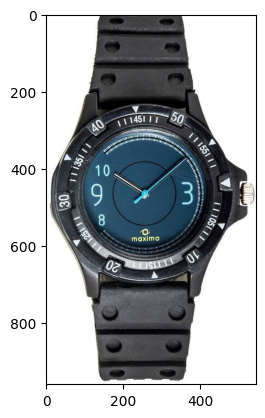

In [107]:
import matplotlib.pyplot as plt
from matplotlib.image import imread
import os
image = imread(path+list_photos[20])
plt.imshow(image)

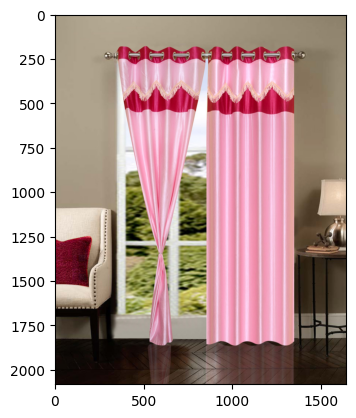

In [108]:
image = imread(path+list_photos[600])
plt.imshow(image)

Notre méthode a parfaitement fonctionné.

A présent, nous allons analyser nos images à l'aide de deux descripteurs, à savoir la méthode SIFT et ORB.

### 2.   Approche SIFT et ORB

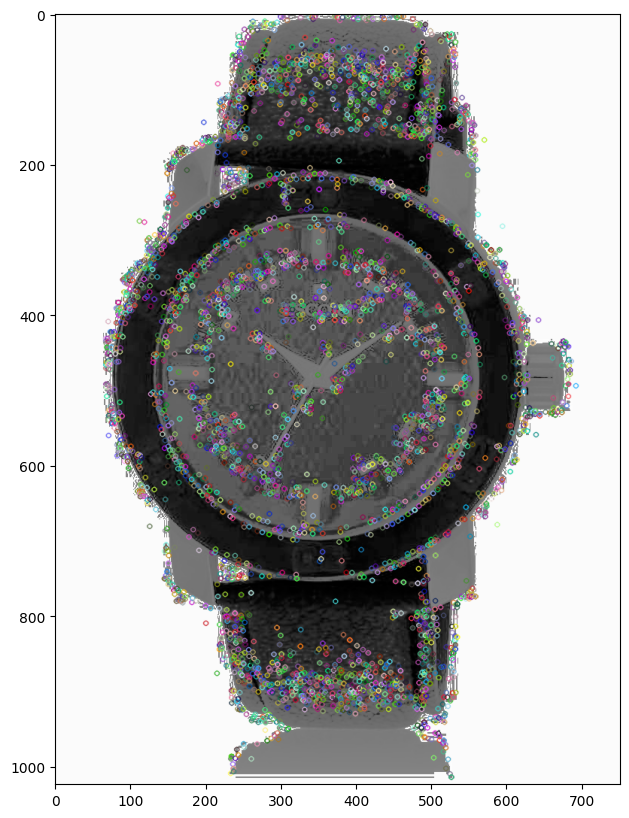

Le nombre de descripteurs pour la méthode SIFT est de :  (4292, 128)


In [109]:
import cv2
# Création du modèle SIFT

sift = cv2.SIFT_create()

# convertir en niveaux de gris
image = cv2.imread(data_image.image[15],0)

# equalize image histogram
image = cv2.equalizeHist(image)


# Création des points de détection des images
kp, des = sift.detectAndCompute(image, None)
img=cv2.drawKeypoints(image,kp,image)

# Représentation graphique
plt.figure(figsize = (10,10))
plt.imshow(img)
plt.show()
print("Le nombre de descripteurs pour la méthode SIFT est de : ", des.shape)

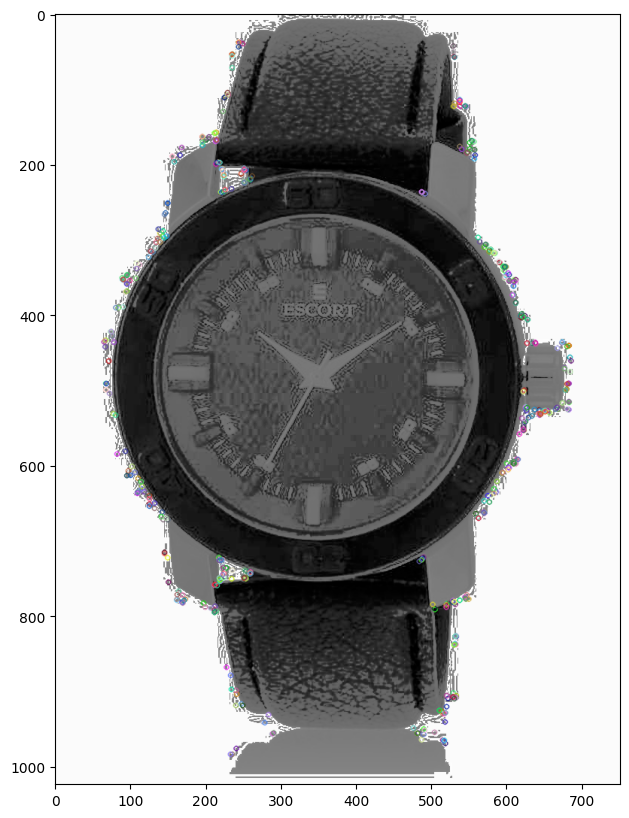

Le nombre de descripteurs pour la méthode ORB est de :  (500, 32)


In [110]:
# Création du modèle ORB
orb = cv2.ORB_create()

# convertir en niveaux de gris
image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
image = cv2.imread(data_image.image[15],0) # convert in gray

image = cv2.equalizeHist(image)   # equalize image histogram

# Création des points de détection des images
kp = orb.detect(image, None)
kp, des = orb.compute(image, kp)
img=cv2.drawKeypoints(image,kp,image)


# Représentation graphique
plt.figure(figsize = (10,10))
plt.imshow(img)
plt.show()
print("Le nombre de descripteurs pour la méthode ORB est de : ", des.shape)

Le modèle SIFT semble être le plus précis concernant l'analyse des images.
En effet, ce modèle prend en compte une plus grande précision des images tandis que le modèle ORB n'analyse qu'à hauteur de 500 points.

Nous allons analyser plus précisement notre modèle SIFT pour les clusters.

In [111]:
data_image.shape[0]

1050

In [112]:
# Utilisation du modèle du SIFT

sift_keypoints = []
temps1 = time.time()
sift = cv2.SIFT_create()


for image_num in range(data_image.shape[0]):
    # Convertir en gris
    image = cv2.imread(data_image.image.iloc[image_num],0) 
    scale = 0.5 # 50% of original image
    width = int(image.shape[1] * scale)
    height = int(image.shape[0] * scale)
    dim = (width, height)    
    image =cv2.resize(image, dim, interpolation = cv2.INTER_AREA)
    res = cv2.equalizeHist(image)   # equalize image histogram
    del image
    kp, des = sift.detectAndCompute(res, None)
    del res
    sift_keypoints.append(des)
    del kp,des
    
    

In [113]:

# liste de descripteurs par image : utilisée pour réaliser les histogrammes par image
sift_keypoints_by_img = np.asarray(sift_keypoints, dtype="object")
# Utilisation du modèle du SIFT

sift_keypoints = []
temps1 = time.time()
sift = cv2.SIFT_create()


for image_num in range(data_image.shape[0]):
    # Convertir en gris
    image = cv2.imread(data_image.image.iloc[image_num],0) 
    scale = 0.5 # 50% of original image
    width = int(image.shape[1] * scale)
    height = int(image.shape[0] * scale)
    dim = (width, height)    
    image =cv2.resize(image, dim, interpolation = cv2.INTER_AREA)
    res = cv2.equalizeHist(image)   # equalize image histogram
    del image
    kp, des = sift.detectAndCompute(res, None)
    del res
    sift_keypoints.append(des)
    del kp,des


# liste de descripteurs pour l'ensemble des images : utilisé pour créer les clusters de descripteurs
sift_keypoints_all = np.concatenate(sift_keypoints_by_img, axis = 0)


print("Nombre de descripteurs : ", sift_keypoints_all.shape)
duration1=time.time()-temps1
print("Le délai de traitement pour le SIFT est de : ", "%15.2f" % duration1, "secondes")


# Sélection du nombre de clusters
temps2=time.time()
k = int(round(np.sqrt(len(sift_keypoints_all)),0))
print("Nombre de clusters estimés : ", k)
print("Création de",k, "clusters de descripteurs ...")

# Clustering
kmeans = cluster.MiniBatchKMeans(n_clusters = k, init_size = 3*k, random_state = 0)
kmeans.fit(sift_keypoints_all)
duration2=time.time()-temps2
print("Le délai de traitement pour le KMeans est de : ", "%15.2f" % duration2, "secondes")

Nombre de descripteurs :  (2451020, 128)
Le délai de traitement pour le SIFT est de :            88.93 secondes
Nombre de clusters estimés :  1566
Création de 1566 clusters de descripteurs ...


KeyboardInterrupt: 

In [ ]:
# Creation of histograms (features)
temps1=time.time()

def build_histogram(kmeans, des, image_num):
    res = kmeans.predict(des)
    hist = np.zeros(len(kmeans.cluster_centers_))
    nb_des=len(des)
    if nb_des==0 : print("problème histogramme image  : ", image_num)
    for i in res:
        hist[i] += 1.0/nb_des
    return hist


# Creation of a matrix of histograms
histo_vect=[]

for i, image_desc in enumerate(sift_keypoints_by_img) :
    if i%100 == 0 : print(i)  
    hist = build_histogram(kmeans, image_desc, i) #calculates the histogram
    histo_vect.append(hist) #histogram is the feature vector

im_features = np.asarray(histo_vect)

duration1=time.time()-temps1
print("temps de création histogrammes : ", "%15.2f" % duration1, "secondes")

0
100
200
300
400
500
600
700
800
900
1000
temps de création histogrammes :            13.31 secondes


In [ ]:
print("Dimensions dataset avant réduction PCA : ", im_features.shape)
pca = decomposition.PCA(n_components = 0.9)
feat_pca= pca.fit_transform(im_features)
print("Dimensions dataset après réduction PCA : ", feat_pca.shape)

Dimensions dataset avant réduction PCA :  (1050, 1566)
Dimensions dataset après réduction PCA :  (1050, 299)


In [ ]:
tsne = manifold.TSNE(n_components=2, learning_rate=200, init='random', random_state=100)
X_tsne_sift = tsne.fit_transform(feat_pca)

df_tsne = pd.DataFrame(X_tsne[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne["class"] = data_image["label"]
print(df_tsne.shape)

(1050, 3)


In [ ]:
X_tsne_sift

array([[-15.503542  ,  20.414324  ],
       [-16.222322  ,   5.640055  ],
       [  0.56357205, -12.18501   ],
       ...,
       [  3.1473012 ,   3.1813583 ],
       [  4.994344  ,  17.579573  ],
       [-10.852801  , -14.357329  ]], dtype=float32)

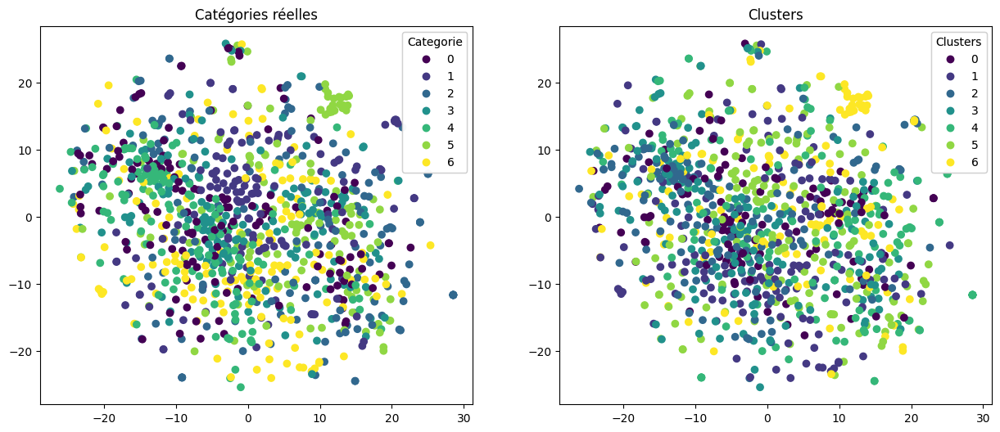

ARI :  0.454


In [ ]:
# Visualisation des clusters
visu_TSNE(X_tsne_sift, y_feature, labels, ARI)

Le résultat obtenu n'est pas cohérent dans notre analyse. Il est difficile d'analyser nos clusters. Nous n'allons pas garder cette méthode.

A présent, nous allons utiliser les modèles de réseaux de neurones avec du Transfer Learning (VGG16 et 19) pour procéder à la segmentation des données.

### 3.   Transfer Learning

In [ ]:
#from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications.vgg16 import decode_predictions
from tensorflow.keras.applications.vgg16 import VGG16

from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.applications.vgg19 import decode_predictions
from tensorflow.keras.applications.vgg19 import VGG19

In [ ]:
# Utilisation du VGG16

model = VGG16()


model = Model(inputs=model.inputs, outputs=model.layers[-2].output)

vect = []
for image_num in range(data_image.shape[0]):
    # load an image from file
    image = load_img(data_image.image.iloc[image_num], target_size=(224, 224))
    # convert the image pixels to a numpy array
    image = img_to_array(image)
    # reshape data for the model
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    # prepare the image for the VGG model
    image = preprocess_input(image)

    # get extracted features
    features = model.predict(image)
    print(features.shape)
    vect.append(features[0])
    im_feat_cnn = pd.DataFrame(vect)
    
temps1=time.time()
duration3=time.time()-temps1
print("temps de traitement kmeans : ", "%15.2f" % duration3, "secondes")

1/1 [==============================] - 0s 268ms/step
(1, 4096)
1/1 [==============================] - 0s 100ms/step
(1, 4096)
1/1 [==============================] - 0s 100ms/step
(1, 4096)
1/1 [==============================] - 0s 93ms/step
(1, 4096)
1/1 [==============================] - 0s 90ms/step
(1, 4096)
1/1 [==============================] - 0s 95ms/step
(1, 4096)
1/1 [==============================] - 0s 99ms/step
(1, 4096)
1/1 [==============================] - 0s 113ms/step
(1, 4096)
1/1 [==============================] - 0s 110ms/step
(1, 4096)
1/1 [==============================] - 0s 112ms/step
(1, 4096)
1/1 [==============================] - 0s 111ms/step
(1, 4096)
1/1 [==============================] - 0s 109ms/step
(1, 4096)
1/1 [==============================] - 0s 113ms/step
(1, 4096)
1/1 [==============================] - 0s 103ms/step
(1, 4096)
1/1 [==============================] - 0s 116ms/step
(1, 4096)
1/1 [==============================] - 0s 101ms/step
(1, 40

Dataset avant PCA :  (1050, 4096)


C:\Users\User\AppData\Roaming\Python\Python310\site-packages\pandas\core\algorithms.py:1814: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\User\AppData\Roaming\Python\Python310\site-packages\pandas\core\algorithms.py:1814: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\User\AppData\Roaming\Python\Python310\site-packages\pandas\core\algorithms.py:1814: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\User\AppData\Roaming\Python\Python310\site-packages\pandas\core\algorithms.py:1814: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\User\AppData\Roaming\Python\Python310\site-packages\pandas\core\alg

Dataset après PCA :  (1050, 314)
ARI :  0.49 Temps d'exécution :  3.0


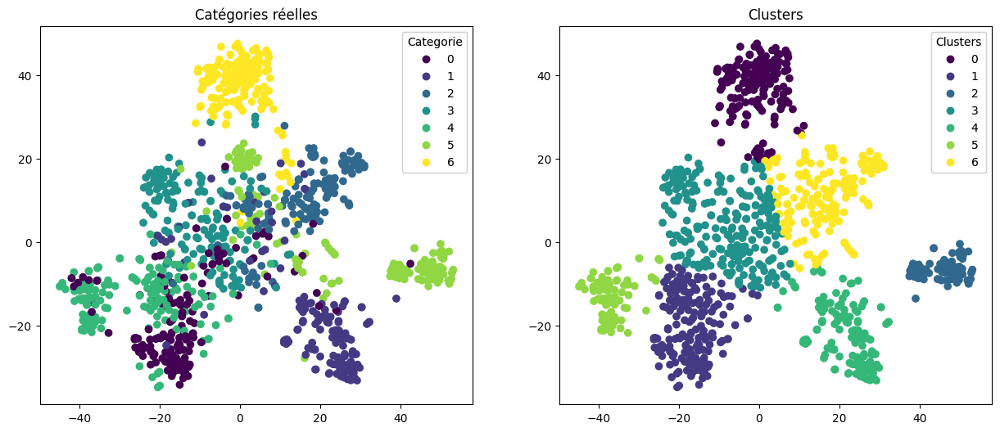

ARI :  0.49


In [ ]:
print("Dataset avant PCA : ", im_feat_cnn.shape)
pca = decomposition.PCA(n_components=0.9)
feat_pca_cnn= pca.fit_transform(im_feat_cnn)
print("Dataset après PCA : ", feat_pca_cnn.shape)

ARI_cnn, X_tsne_cnn, labels_cnn = ARI_fct(feat_pca_cnn)

visu_TSNE(X_tsne_cnn, y_feature, labels_cnn, ARI_cnn)

In [ ]:
# Utilisation du VGG19

model = VGG19()
# remove the output layer

model = Model(inputs=model.inputs, outputs=model.layers[-2].output)

vect = []
for image_num in range(data_image.shape[0]):
    # load an image from file
    image = load_img(data_image.image.iloc[image_num], target_size=(224, 224))
    # convert the image pixels to a numpy array
    image = img_to_array(image)
    # reshape data for the model
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    # prepare the image for the VGG model
    image = preprocess_input(image)

    # get extracted features
    features = model.predict(image)
    print(features.shape)
    vect.append(features[0])
    im_feat_cnn = pd.DataFrame(vect)

1/1 [==============================] - 0s 253ms/step
(1, 4096)
1/1 [==============================] - 0s 128ms/step
(1, 4096)
1/1 [==============================] - 0s 121ms/step
(1, 4096)
1/1 [==============================] - 0s 130ms/step
(1, 4096)
1/1 [==============================] - 0s 120ms/step
(1, 4096)
1/1 [==============================] - 0s 136ms/step
(1, 4096)
1/1 [==============================] - 0s 133ms/step
(1, 4096)
1/1 [==============================] - 0s 130ms/step
(1, 4096)
1/1 [==============================] - 0s 124ms/step
(1, 4096)
1/1 [==============================] - 0s 125ms/step
(1, 4096)
1/1 [==============================] - 0s 130ms/step
(1, 4096)
1/1 [==============================] - 0s 114ms/step
(1, 4096)
1/1 [==============================] - 0s 117ms/step
(1, 4096)
1/1 [==============================] - 0s 109ms/step
(1, 4096)
1/1 [==============================] - 0s 113ms/step
(1, 4096)
1/1 [==============================] - 0s 125ms/step
(1

In [ ]:
labels_cnn

array([5, 1, 1, ..., 3, 3, 3])

In [ ]:
y_feature

0       4
1       0
2       0
3       4
4       4
       ..
1045    0
1046    0
1047    0
1048    0
1049    0
Name: label, Length: 1050, dtype: int32

### Création de clusters à partir du T-SNE et affichage des images selon clusters
* Attention : ici, il ne s'agit pas de faire une classification non supervisée, mais simplement, par une mesure de l'ARI, de conforter l'analyse graphique précédente qui démontre la faisabilité de réaliser ultérieurement une classification supervisée. Cette mesure de l'ARI nécessite de créer des clusters théoriques via KMeans
* Il s'agit donc de réaliser une mesure de ce que nous voyons graphiquement, donc à partir des données en sortie du t-sne
* Pour réaliser une classification non supervisée, il aurait fallu repartir des données avant t-sne
* Dans la démarche en 2 étapes, il n'est pas utile de réaliser une classification non supervisée, une classification supervisée est bien plus performante. Même le calcul de l'ARI n'est pas indispensable, nous pourrions passer directement du graphique t-sne précédent à l'étape 2 de classification supervisée
* Il n'est donc pas utile de passer du temps à optimiser l'ARI, un ordre de grandeur suffit pour conforter le 1er graphique t-sne. D'ailleurs la meilleure solution de feature engineering ne génère pas toujours le meilleur ARI. L'analyse graphique t-sne est bien plus riche d'enseignement


Dataset avant  PCA :  (1050, 4096)


C:\Users\User\AppData\Roaming\Python\Python310\site-packages\pandas\core\algorithms.py:1814: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\User\AppData\Roaming\Python\Python310\site-packages\pandas\core\algorithms.py:1814: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\User\AppData\Roaming\Python\Python310\site-packages\pandas\core\algorithms.py:1814: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\User\AppData\Roaming\Python\Python310\site-packages\pandas\core\algorithms.py:1814: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\User\AppData\Roaming\Python\Python310\site-packages\pandas\core\alg

Dataset après PCA :  (1050, 308)
ARI :  0.5339 Temps d'exécution :  2.0


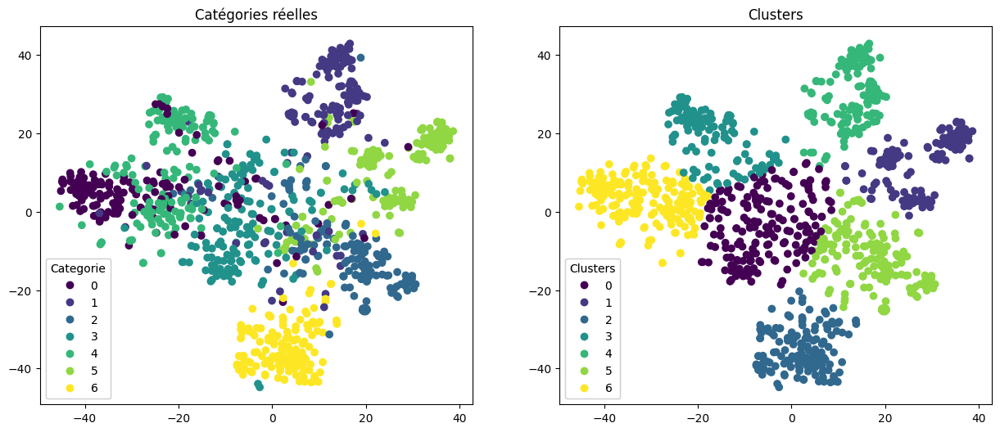

ARI :  0.5339


In [ ]:
print("Dataset avant  PCA : ", im_feat_cnn.shape)
pca = decomposition.PCA(n_components=0.9)
feat_pca_cnn= pca.fit_transform(im_feat_cnn)
print("Dataset après PCA : ", feat_pca_cnn.shape)

ARI_cnn, X_tsne_cnn, labels_cnn = ARI_fct(feat_pca_cnn)

visu_TSNE(X_tsne_cnn, y_feature, labels_cnn, ARI_cnn)

Nous pouvons de suite constater une très forte amélioration de notre score ARI avec l'utilisation du modèle VGG 19.

Ce dernier présente un temps d'exécution plus important mais une amélioration d'environ 0.1 sur le score.

In [ ]:
conf_mat = metrics.confusion_matrix(y_feature, labels_cnn)
print(conf_mat)

[[ 21   2   1  12   2   4 108]
 [ 14   2   2   3 116   9   4]
 [ 19   2   1   1   3 123   1]
 [110   8   2  21   2   5   2]
 [ 11   0   0  74   0   0  65]
 [ 12 110   0   0   6  22   0]
 [  0   0 141   0   0   9   0]]


In [ ]:
def conf_mat_transform(y_true,y_pred) :
    conf_mat = metrics.confusion_matrix(y_true,y_pred)
    
    corresp = np.argmax(conf_mat, axis=0)
    print ("Correspondance des clusters : ", corresp)
    # y_pred_transform = np.apply_along_axis(correspond_fct, 1, y_pred)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['y_pred'] = y_pred
    labels['y_pred_transform'] = labels['y_pred'].apply(lambda x : corresp[x]) 
    
    return labels['y_pred_transform']

In [ ]:
cls_labels_transform = conf_mat_transform(y_feature, labels_cnn)
conf_mat = metrics.confusion_matrix(y_feature, cls_labels_transform)
print(conf_mat)
print()
print(metrics.classification_report(y_feature, cls_labels_transform))

Correspondance des clusters :  [3 5 6 4 1 2 0]
[[108   2   4  21  12   2   1]
 [  4 116   9  14   3   2   2]
 [  1   3 123  19   1   2   1]
 [  2   2   5 110  21   8   2]
 [ 65   0   0  11  74   0   0]
 [  0   6  22  12   0 110   0]
 [  0   0   9   0   0   0 141]]

              precision    recall  f1-score   support

           0       0.60      0.72      0.65       150
           1       0.90      0.77      0.83       150
           2       0.72      0.82      0.76       150
           3       0.59      0.73      0.65       150
           4       0.67      0.49      0.57       150
           5       0.89      0.73      0.80       150
           6       0.96      0.94      0.95       150

    accuracy                           0.74      1050
   macro avg       0.76      0.74      0.75      1050
weighted avg       0.76      0.74      0.75      1050



In [ ]:
list_labels = ["HomeFurnishing", "BabyCare", "Watches", "HomeDecor&FestiveNeeds","Kitchen&Dining","BeautyandPersonalCare","Computers"]

<Axes: >

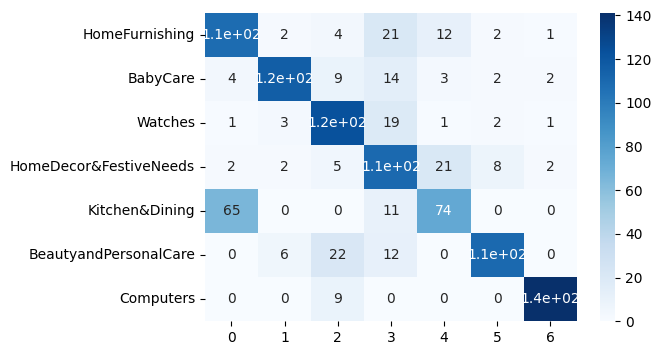

In [ ]:
df_cm = pd.DataFrame(conf_mat, index = [label for label in list_labels],
                  columns = [i for i in "0123456"])
plt.figure(figsize = (6,4))
sns.heatmap(df_cm, annot=True, cmap="Blues")

### VI. Conclusion Etude de faisabilité

À travers cette première section, nous pouvons affirmer que nous avons favorablement répondu à la demande d'étude et de catégorisation des produits. Notre démarche s'est articulée autour de deux grandes étapes : le traitement des textes et le traitement des images.

Pour le traitement des textes, nous avons principalement appliqué des techniques standard telles que le comptage des mots et la suppression des termes inutiles, tels que les déterminants et les chiffres. Cette procédure a facilité la segmentation grâce à des méthodes de traitement telles que l'Utilisation d'Embeddings Universels (USE) et BERT. Nous constatons que la méthode TF-IDF a donné les meilleurs résultats lors de la phase de traitement des textes, obtenant le score le plus élevé.

En ce qui concerne le traitement des images, nous avons extrait les données à partir de 1050 images stockées dans un fichier dédié. L'analyse des images a été effectuée à travers diverses méthodes, notamment les méthodes SIFT et ORB, qui n'ont pas répondu à nos attentes. De plus, ces deux méthodes semblent être peu utilisées en raison de leur ancienneté. Les approches basées sur les réseaux de neurones, en particulier les modèles de Transfer Learning VGG16 et VGG19, ont produit les résultats les plus prometteurs.

Le modèle VGG19 a démontré des performances particulièrement intéressantes. 
Dans la phase de classification à venir, nous allons examiner individuellement ALBEF, un modèle intégrant BERT pour le traitement du texte et une Vision Transformer pour le traitement d'image. ALBEF offre une approche conjointe pour la classification, exploitant la force de BERT pour la compréhension contextuelle des textes et celle de Vision Transformer pour la représentation d'images.

De manière distincte, nous explorerons l'utilisation simultanée de BERT, un modèle NLP de pointe, et ResNet-50, une architecture de réseau neuronal convolutif réputée pour le traitement d'image. En combinant ces deux approches, nous visons à tirer parti des capacités de BERT pour la compréhension textuelle et de ResNet-50 pour l'analyse d'images, espérant ainsi obtenir une classification plus robuste et précise grâce à la fusion des informations textuelles et visuelles.